<a href="https://colab.research.google.com/github/Chakita/Data-Analytics-Project/blob/master/Data_Analytics_Models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing libraries


In [ ]:
! pip install geopandas
! pip install country_converter
!pip install mord

     |████████████████████████████████| 1.0 MB 4.2 MB/s 
     |████████████████████████████████| 15.4 MB 38.3 MB/s 
     |████████████████████████████████| 6.3 MB 17.6 MB/s 
     |████████████████████████████████| 50 kB 2.7 MB/s 
  Created wheel for country-converter: filename=country_converter-0.7.4-py3-none-any.whl size=53543 sha256=46c5d1b3d52d2b33dabd19d970c7ae076375909cf594f2965cf85e517ff1a183
  Stored in directory: /root/.cache/pip/wheels/69/cf/84/9ebca78737327440a0bb5faa6d0380e9017730534cf0dbcb8c
Successfully built country-converter
  Created wheel for mord: filename=mord-0.6-py3-none-any.whl size=6006 sha256=8b688f48c0751d61caad71824a58f3b52405f111a9e2aa3746ef11d41b2e9e8b
  Stored in directory: /root/.cache/pip/wheels/80/1d/8a/bef1a01b6a3c91494905d161d5426c181819f9730a773141eb
Successfully built mord


In [ ]:
!pip install pycaret

     |████████████████████████████████| 288 kB 3.9 MB/s 
     |████████████████████████████████| 1.3 MB 50.9 MB/s 
     |████████████████████████████████| 86 kB 6.5 MB/s 
     |████████████████████████████████| 2.0 MB 67.7 MB/s 
     |████████████████████████████████| 15.5 MB 59.5 MB/s 
     |████████████████████████████████| 6.8 MB 47.0 MB/s 
     |████████████████████████████████| 113 kB 69.5 MB/s 
     |████████████████████████████████| 167 kB 69.5 MB/s 
     |████████████████████████████████| 1.7 MB 72.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 56 kB 4.6 MB/s 
     |████████████████████████████████| 261 kB 70.5 MB/s 
     |████████████████████████████████| 303 kB 62.2 MB/s 
     |████████████████████████████████| 675 kB 73.4 MB/s 
     |████████████████████████████████| 10.1 MB 46.5 MB/s 
     |████████████████

In [ ]:
! unzip /content/ne_10m_admin_0_countries.zip -d /content/ne_10m_admin_0_countries

Archive:  /content/ne_10m_admin_0_countries.zip
  inflating: /content/ne_10m_admin_0_countries/ne_10m_admin_0_countries.README.html  
 extracting: /content/ne_10m_admin_0_countries/ne_10m_admin_0_countries.VERSION.txt  
 extracting: /content/ne_10m_admin_0_countries/ne_10m_admin_0_countries.cpg  
  inflating: /content/ne_10m_admin_0_countries/ne_10m_admin_0_countries.dbf  
  inflating: /content/ne_10m_admin_0_countries/ne_10m_admin_0_countries.prj  
  inflating: /content/ne_10m_admin_0_countries/ne_10m_admin_0_countries.shp  
  inflating: /content/ne_10m_admin_0_countries/ne_10m_admin_0_countries.shx  


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
import geopandas as gpd
import matplotlib.pyplot as plt
import country_converter as coco
import numpy as np
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
import mord as m
from sklearn.model_selection import train_test_split
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import f1_score

# Reading all the datasets

In [ ]:
clean_df = pd.read_csv("Covidistress_final.csv")
health_exp = pd.read_csv("Healthcare expenditure.csv")
original = pd.read_csv("COVIDiSTRESS_May_30_cleaned_final.csv",encoding = "ISO-8859-1",dtype='unicode')
lockdown_stringency = pd.read_csv("covid-stringency-index.csv")

## Columns in each dataset

In [ ]:
clean_df.columns

Index(['Unnamed: 0', 'Dem_age', 'Dem_gender', 'Dem_edu', 'Dem_edu_mom',
       'Dem_employment', 'Country', 'Dem_Expat', 'Dem_state',
       'Dem_maritalstatus', 'Dem_dependents', 'Dem_riskgroup', 'Dem_isolation',
       'Dem_isolation_adults', 'Dem_isolation_kids', 'AD_gain', 'AD_loss',
       'Scale_PSS10_UCLA_1', 'Scale_PSS10_UCLA_2', 'Scale_PSS10_UCLA_3',
       'Scale_PSS10_UCLA_4', 'Scale_PSS10_UCLA_5', 'Scale_PSS10_UCLA_6',
       'Scale_PSS10_UCLA_7', 'Scale_PSS10_UCLA_8', 'Scale_PSS10_UCLA_9',
       'Scale_PSS10_UCLA_10', 'Scale_SLON_1', 'Scale_SLON_2', 'Scale_SLON_3',
       'OECD_people_1', 'OECD_people_2', 'OECD_insititutions_1',
       'OECD_insititutions_2', 'OECD_insititutions_3', 'OECD_insititutions_4',
       'OECD_insititutions_5', 'OECD_insititutions_6', 'Corona_concerns_1',
       'Corona_concerns_2', 'Corona_concerns_3', 'Corona_concerns_4',
       'Corona_concerns_5', 'Trust_countrymeasure', 'Compliance_1',
       'Compliance_2', 'Compliance_3', 'Compliance_4', '

In [ ]:
clean_df.isna().sum()

Unnamed: 0          0
Dem_age             0
Dem_gender        306
Dem_edu           839
Dem_edu_mom      2143
                ...  
Expl_media_2    32653
Expl_media_3    32633
Expl_media_4    32619
Expl_media_5    32616
Expl_media_6    32601
Length: 73, dtype: int64

In [ ]:
clean_df=clean_df.loc[(clean_df!=0).any(axis=1)]

In [ ]:
clean_df.shape

(125306, 73)

In [ ]:
for col in original.columns:
  print(col)

ID
answered_all
Duration..in.seconds.
RecordedDate
UserLanguage
Dem_age
Dem_gender
Dem_edu
Dem_edu_mom
Dem_employment
Country
Dem_Expat
Dem_state
Dem_maritalstatus
Dem_dependents
Dem_riskgroup
Dem_isolation
Dem_isolation_adults
Dem_isolation_kids
AD_gain
AD_loss
AD_check
Scale_PSS10_UCLA_1
Scale_PSS10_UCLA_2
Scale_PSS10_UCLA_3
Scale_PSS10_UCLA_4
Scale_PSS10_UCLA_5
Scale_PSS10_UCLA_6
Scale_PSS10_UCLA_7
Scale_PSS10_UCLA_8
Scale_PSS10_UCLA_9
Scale_PSS10_UCLA_10
Scale_SLON_1
Scale_SLON_2
Scale_SLON_3
OECD_people_1
OECD_people_2
OECD_insititutions_1
OECD_insititutions_2
OECD_insititutions_3
OECD_insititutions_4
OECD_insititutions_5
OECD_insititutions_6
Corona_concerns_1
Corona_concerns_2
Corona_concerns_3
Corona_concerns_4
Corona_concerns_5
Trust_countrymeasure
Compliance_1
Compliance_2
Compliance_3
Compliance_4
Compliance_5
Compliance_6
born_92
experience_war
experience_war_TXT
war_injury
loss_during_war
time_spent_in_war
time_spent_in_war_TXT
Scale_UCLA_TRI_1
Scale_UCLA_TRI_2
Scale_UCLA_T

## More preprocessing on the dataset 

In [ ]:
clean_df.shape

(125306, 73)

In [ ]:
clean_df.dropna(inplace=True)
clean_df

,Unnamed: 0,Dem_age,Dem_gender,Dem_edu,Dem_edu_mom,Dem_employment,Country,Dem_Expat,Dem_state,Dem_maritalstatus,Dem_dependents,Dem_riskgroup,Dem_isolation,Dem_isolation_adults,Dem_isolation_kids,AD_gain,AD_loss,Scale_PSS10_UCLA_1,Scale_PSS10_UCLA_2,Scale_PSS10_UCLA_3,Scale_PSS10_UCLA_4,Scale_PSS10_UCLA_5,Scale_PSS10_UCLA_6,Scale_PSS10_UCLA_7,Scale_PSS10_UCLA_8,Scale_PSS10_UCLA_9,Scale_PSS10_UCLA_10,Scale_SLON_1,Scale_SLON_2,Scale_SLON_3,OECD_people_1,OECD_people_2,OECD_insititutions_1,OECD_insititutions_2,OECD_insititutions_3,OECD_insititutions_4,OECD_insititutions_5,OECD_insititutions_6,Corona_concerns_1,Corona_concerns_2,Corona_concerns_3,Corona_concerns_4,Corona_concerns_5,Trust_countrymeasure,Compliance_1,Compliance_2,Compliance_3,Compliance_4,Compliance_5,Compliance_6,PSS10_avg,Expl_Coping_1,Expl_Coping_2,Expl_Coping_3,Expl_Coping_4,Expl_Coping_5,Expl_Coping_6,Expl_Coping_7,Expl_Coping_8,Expl_Coping_9,Expl_Coping_10,Expl_Coping_11,Expl_Coping_12,Expl_Coping_13,Expl_Coping_14,Expl_Coping_15,Expl_Coping_16,Expl_media_1,Expl_media_2,Expl_media_3,Expl_media_4,Expl_media_5,Expl_media_6
1,1,20,Male,"College degree, bachelor, master",None,Student,Pakistan,yes,<U+0622><U+0632><U+0627><U+062F> <U+06A9><U+06...,Single,0.0,Yes,Life carries on with minor changes,0,0,0.0,0.0,3,3,1,5,2,3,4,4,2,1,3,1,3,3,10,5,4,4,2,4,5,1,2,4,4,5,5,6,3,3,2,4,2,2.2,4.0,5.0,5.0,3.0,5.0,4.0,2.0,2.0,3.0,5.0,3.0,4.0,5.0,5.0,5.0,3.0,1.0,2.0,3.0,4.0,2.0,3.0
5,5,68,Male,"College degree, bachelor, master",College degree,Retired,Italy,no,liguria,Married/cohabiting,0.0,No,Life carries on with minor changes,1,0,0.0,0.0,1,2,3,4,4,2,4,4,2,3,2,2,3,7,7,7,7,8,8,7,8,5,5,5,5,5,5,5,5,5,4,4,1,2.1,5.0,3.0,5.0,3.0,5.0,4.0,2.0,2.0,5.0,4.0,5.0,5.0,4.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0
6,6,29,Other/would rather not say,"Some College, short continuing education or eq...",Some College or equivalent,Part time employed,Argentina,no,Chubut,Other or would rather not say,1.0,Yes,Isolated,0,1,0.0,0.0,2,2,3,4,3,3,5,3,2,2,4,1,3,6,7,3,2,3,4,0,3,2,2,2,5,5,5,5,5,5,3,5,2,2.3,4.0,3.0,5.0,5.0,4.0,5.0,2.0,4.0,4.0,4.0,4.0,4.0,5.0,4.0,2.0,5.0,5.0,4.0,4.0,2.0,5.0,2.0
7,7,38,Female,Up to 12 years of school,Up to 12 years of school,Not employed,Argentina,no,Entre Rios,Married/cohabiting,1.0,Yes,Life carries on with minor changes,1,0,0.0,0.0,3,3,3,4,4,3,4,4,3,3,2,3,3,5,7,3,5,4,3,4,6,4,4,3,3,4,4,5,5,5,2,3,5,2.6,4.0,5.0,2.0,2.0,2.0,5.0,5.0,5.0,5.0,2.0,5.0,4.0,2.0,2.0,3.0,4.0,2.0,2.0,4.0,4.0,5.0,4.0
11,11,31,Female,"College degree, bachelor, master",College degree,Full time employed,Argentina,no,Tierra del fuego,Single,0.0,No,Isolated,3,0,1.0,0.0,2,1,4,4,3,3,3,2,3,2,3,2,3,4,6,5,5,4,6,4,5,3,4,5,6,5,6,5,5,5,3,5,4,2.7,4.0,2.0,5.0,2.0,5.0,5.0,2.0,2.0,5.0,4.0,3.0,4.0,6.0,5.0,1.0,4.0,3.0,5.0,4.0,4.0,5.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125291,125291,37,Female,Up to 12 years of school,Up to 9 years of school,Not employed,Denmark,yes,Aalborg,Single,0.0,Yes,Isolated,0,0,0.0,0.0,3,4,4,2,2,5,3,3,4,3,5,3,5,4,9,4,10,7,7,7,9,6,6,5,5,4,3,5,6,6,6,4,6,3.7,4.0,6.0,6.0,1.0,1.0,2.0,4.0,1.0,5.0,1.0,4.0,5.0,1.0,5.0,4.0,4.0,5.0,3.0,5.0,4.0,5.0,5.0
125295,125295,58,Male,"College degree, bachelor, master",Up to 9 years of school,Self-employed,Denmark,yes,Ballerup,Married/cohabiting,3.0,Yes,Life carries on with minor changes,1,0,1.0,0.0,1,2,2,5,3,2,5,4,1,2,1,1,1,9,10,6,7,7,8,7,8,2,2,3,5,5,6,6,6,6,1,5,1,1.7,5.0,6.0,4.0,1.0,2.0,4.0,1.0,1.0,5.0,3.0,3.0,4.0,6.0,1.0,1.0,5.0,6.0,3.0,4.0,1.0,5.0,2.0
125296,125296,28,Male,"College degree, bachelor, master",Up to 12 years of school,Full time employed,Denmark,yes,Kobenhavn,Single,0.0,Not sure,Isolated,0,0,1.0,0.0,3,1,1,5,4,1,4,4,3,1,1,1,5,3,6,9,9,9,9,9,7,1,3,2,5,5,6,6,3,2,2,4,1,1.7,4.0,6.0,6.0,1.0,6.0,6.0,3.0,6.0,5.0,4.0,1.0,3

In [ ]:
clean_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73383 entries, 1 to 125304
Data columns (total 73 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            73383 non-null  int64  
 1   Dem_age               73383 non-null  int64  
 2   Dem_gender            73383 non-null  object 
 3   Dem_edu               73383 non-null  object 
 4   Dem_edu_mom           73383 non-null  object 
 5   Dem_employment        73383 non-null  object 
 6   Country               73383 non-null  object 
 7   Dem_Expat             73383 non-null  object 
 8   Dem_state             73383 non-null  object 
 9   Dem_maritalstatus     73383 non-null  object 
 10  Dem_dependents        73383 non-null  float64
 11  Dem_riskgroup         73383 non-null  object 
 12  Dem_isolation         73383 non-null  object 
 13  Dem_isolation_adults  73383 non-null  int64  
 14  Dem_isolation_kids    73383 non-null  int64  
 15  AD_gain           

## Coverting object columns to categorical

In [ ]:
clean_df.loc[:,clean_df.select_dtypes(['object']).columns]=clean_df.select_dtypes(['object']).apply(pd.Series.astype,dtype='category')
clean_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73383 entries, 1 to 125304
Data columns (total 73 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   Unnamed: 0            73383 non-null  int64   
 1   Dem_age               73383 non-null  int64   
 2   Dem_gender            73383 non-null  category
 3   Dem_edu               73383 non-null  category
 4   Dem_edu_mom           73383 non-null  category
 5   Dem_employment        73383 non-null  category
 6   Country               73383 non-null  category
 7   Dem_Expat             73383 non-null  category
 8   Dem_state             73383 non-null  category
 9   Dem_maritalstatus     73383 non-null  category
 10  Dem_dependents        73383 non-null  float64 
 11  Dem_riskgroup         73383 non-null  category
 12  Dem_isolation         73383 non-null  category
 13  Dem_isolation_adults  73383 non-null  int64   
 14  Dem_isolation_kids    73383 non-null  int64   
 15  A

## Encoding categorical columns


Not using OneHotEncoder here because the dataset is huuuge xD

In [ ]:
# TODO
# Try OHE for gender,marital status, risk group, isolation

In [ ]:
cols=clean_df.select_dtypes(['category']).columns.to_list()
label_object = {}
for col in cols:
  labelencoder = LabelEncoder()
  labelencoder.fit(clean_df[col])
  clean_df[col] = labelencoder.fit_transform(clean_df[col])
  label_object[col] = labelencoder

In [ ]:
clean_df.head()

,Unnamed: 0,Dem_age,Dem_gender,Dem_edu,Dem_edu_mom,Dem_employment,Country,Dem_Expat,Dem_state,Dem_maritalstatus,Dem_dependents,Dem_riskgroup,Dem_isolation,Dem_isolation_adults,Dem_isolation_kids,AD_gain,AD_loss,Scale_PSS10_UCLA_1,Scale_PSS10_UCLA_2,Scale_PSS10_UCLA_3,Scale_PSS10_UCLA_4,Scale_PSS10_UCLA_5,Scale_PSS10_UCLA_6,Scale_PSS10_UCLA_7,Scale_PSS10_UCLA_8,Scale_PSS10_UCLA_9,Scale_PSS10_UCLA_10,Scale_SLON_1,Scale_SLON_2,Scale_SLON_3,OECD_people_1,OECD_people_2,OECD_insititutions_1,OECD_insititutions_2,OECD_insititutions_3,OECD_insititutions_4,OECD_insititutions_5,OECD_insititutions_6,Corona_concerns_1,Corona_concerns_2,Corona_concerns_3,Corona_concerns_4,Corona_concerns_5,Trust_countrymeasure,Compliance_1,Compliance_2,Compliance_3,Compliance_4,Compliance_5,Compliance_6,PSS10_avg,Expl_Coping_1,Expl_Coping_2,Expl_Coping_3,Expl_Coping_4,Expl_Coping_5,Expl_Coping_6,Expl_Coping_7,Expl_Coping_8,Expl_Coping_9,Expl_Coping_10,Expl_Coping_11,Expl_Coping_12,Expl_Coping_13,Expl_Coping_14,Expl_Coping_15,Expl_Coping_16,Expl_media_1,Expl_media_2,Expl_media_3,Expl_media_4,Expl_media_5,Expl_media_6
1,1,20,1,0,1,5,105,1,659,3,0.0,2,4,0,0,0.0,0.0,3,3,1,5,2,3,4,4,2,1,3,1,3,3,10,5,4,4,2,4,5,1,2,4,4,5,5,6,3,3,2,4,2,2.2,4.0,5.0,5.0,3.0,5.0,4.0,2.0,2.0,3.0,5.0,3.0,4.0,5.0,5.0,5.0,3.0,1.0,2.0,3.0,4.0,2.0,3.0
5,5,68,1,0,0,3,63,0,7656,1,0.0,0,4,1,0,0.0,0.0,1,2,3,4,4,2,4,4,2,3,2,2,3,7,7,7,7,8,8,7,8,5,5,5,5,5,5,5,5,5,4,4,1,2.1,5.0,3.0,5.0,3.0,5.0,4.0,2.0,2.0,5.0,4.0,5.0,5.0,4.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0
6,6,29,2,3,3,2,6,0,1978,2,1.0,2,1,0,1,0.0,0.0,2,2,3,4,3,3,5,3,2,2,4,1,3,6,7,3,2,3,4,0,3,2,2,2,5,5,5,5,5,5,3,5,2,2.3,4.0,3.0,5.0,5.0,4.0,5.0,2.0,4.0,4.0,4.0,4.0,4.0,5.0,4.0,2.0,5.0,5.0,4.0,4.0,2.0,5.0,2.0
7,7,38,0,5,5,1,6,0,2344,1,1.0,2,4,1,0,0.0,0.0,3,3,3,4,4,3,4,4,3,3,2,3,3,5,7,3,5,4,3,4,6,4,4,3,3,4,4,5,5,5,2,3,5,2.6,4.0,5.0,2.0,2.0,2.0,5.0,5.0,5.0,5.0,2.0,5.0,4.0,2.0,2.0,3.0,4.0,2.0,2.0,4.0,4.0,5.0,4.0
11,11,31,0,0,0,0,6,0,6458,3,0.0,0,1,3,0,1.0,0.0,2,1,4,4,3,3,3,2,3,2,3,2,3,4,6,5,5,4,6,4,5,3,4,5,6,5,6,5,5,5,3,5,4,2.7,4.0,2.0,5.0,2.0,5.0,5.0,2.0,2.0,5.0,4.0,3.0,4.0,6.0,5.0,1.0,4.0,3.0,5.0,4.0,4.0,5.0,1.0


## Inverse Transform

In [ ]:
  inv_df=pd.DataFrame()
  for col in cols:
    inv_df[col]=label_object[col].inverse_transform(clean_df[col])

In [ ]:
clean_df['Country']=  label_object['Country'].inverse_transform(clean_df['Country'])

In [ ]:

#inv_df

In [ ]:
clean_df.head()

,Unnamed: 0,Dem_age,Dem_gender,Dem_edu,Dem_edu_mom,Dem_employment,Country,Dem_Expat,Dem_state,Dem_maritalstatus,Dem_dependents,Dem_riskgroup,Dem_isolation,Dem_isolation_adults,Dem_isolation_kids,AD_gain,AD_loss,Scale_PSS10_UCLA_1,Scale_PSS10_UCLA_2,Scale_PSS10_UCLA_3,Scale_PSS10_UCLA_4,Scale_PSS10_UCLA_5,Scale_PSS10_UCLA_6,Scale_PSS10_UCLA_7,Scale_PSS10_UCLA_8,Scale_PSS10_UCLA_9,Scale_PSS10_UCLA_10,Scale_SLON_1,Scale_SLON_2,Scale_SLON_3,OECD_people_1,OECD_people_2,OECD_insititutions_1,OECD_insititutions_2,OECD_insititutions_3,OECD_insititutions_4,OECD_insititutions_5,OECD_insititutions_6,Corona_concerns_1,Corona_concerns_2,Corona_concerns_3,Corona_concerns_4,Corona_concerns_5,Trust_countrymeasure,Compliance_1,Compliance_2,Compliance_3,Compliance_4,Compliance_5,Compliance_6,PSS10_avg,Expl_Coping_1,Expl_Coping_2,Expl_Coping_3,Expl_Coping_4,Expl_Coping_5,Expl_Coping_6,Expl_Coping_7,Expl_Coping_8,Expl_Coping_9,Expl_Coping_10,Expl_Coping_11,Expl_Coping_12,Expl_Coping_13,Expl_Coping_14,Expl_Coping_15,Expl_Coping_16,Expl_media_1,Expl_media_2,Expl_media_3,Expl_media_4,Expl_media_5,Expl_media_6
1,1,20,1,0,1,5,Pakistan,1,659,3,0.0,2,4,0,0,0.0,0.0,3,3,1,5,2,3,4,4,2,1,3,1,3,3,10,5,4,4,2,4,5,1,2,4,4,5,5,6,3,3,2,4,2,2.2,4.0,5.0,5.0,3.0,5.0,4.0,2.0,2.0,3.0,5.0,3.0,4.0,5.0,5.0,5.0,3.0,1.0,2.0,3.0,4.0,2.0,3.0
5,5,68,1,0,0,3,Italy,0,7656,1,0.0,0,4,1,0,0.0,0.0,1,2,3,4,4,2,4,4,2,3,2,2,3,7,7,7,7,8,8,7,8,5,5,5,5,5,5,5,5,5,4,4,1,2.1,5.0,3.0,5.0,3.0,5.0,4.0,2.0,2.0,5.0,4.0,5.0,5.0,4.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0
6,6,29,2,3,3,2,Argentina,0,1978,2,1.0,2,1,0,1,0.0,0.0,2,2,3,4,3,3,5,3,2,2,4,1,3,6,7,3,2,3,4,0,3,2,2,2,5,5,5,5,5,5,3,5,2,2.3,4.0,3.0,5.0,5.0,4.0,5.0,2.0,4.0,4.0,4.0,4.0,4.0,5.0,4.0,2.0,5.0,5.0,4.0,4.0,2.0,5.0,2.0
7,7,38,0,5,5,1,Argentina,0,2344,1,1.0,2,4,1,0,0.0,0.0,3,3,3,4,4,3,4,4,3,3,2,3,3,5,7,3,5,4,3,4,6,4,4,3,3,4,4,5,5,5,2,3,5,2.6,4.0,5.0,2.0,2.0,2.0,5.0,5.0,5.0,5.0,2.0,5.0,4.0,2.0,2.0,3.0,4.0,2.0,2.0,4.0,4.0,5.0,4.0
11,11,31,0,0,0,0,Argentina,0,6458,3,0.0,0,1,3,0,1.0,0.0,2,1,4,4,3,3,3,2,3,2,3,2,3,4,6,5,5,4,6,4,5,3,4,5,6,5,6,5,5,5,3,5,4,2.7,4.0,2.0,5.0,2.0,5.0,5.0,2.0,2.0,5.0,4.0,3.0,4.0,6.0,5.0,1.0,4.0,3.0,5.0,4.0,4.0,5.0,1.0


## Making  a dataset with the following columns:
1. Avg Perceived Stress Score on Country Level 
2. Avg Trust in government- Country level
3. Avg Covid_concern - Country level
4. Avg concern for country
5. Country expenditure on health
6. Country lockdown stringency index

### Getting healthcare expenditure and stringency info about the countries in the Covidistress dataset

In [ ]:
original["PSS10_avg"] = original["PSS10_avg"].astype(float)
original["Trust_countrymeasure"]=original["Trust_countrymeasure"].astype(float)
cols=["Corona_concerns_1","Corona_concerns_2","Corona_concerns_3","Corona_concerns_4","Corona_concerns_5"]
cols2=["Compliance_1","Compliance_2","Compliance_3","Compliance_4","Compliance_5","Compliance_6"]
original.dropna(subset=cols+cols2,inplace=True)
original[cols]= original[cols].apply(pd.Series.astype,dtype="float")
original[cols2]= original[cols2].apply(pd.Series.astype,dtype="float")
original["Avg_concern"]=original[cols].median(axis=1,skipna=True)
original["Avg_compliance"]=original[cols2].median(axis=1,skipna=True)
original["SPS_avg"]=original["SPS_avg"].astype(float)

In [ ]:
original["Avg_concern"]

1         4.0
5         5.0
6         2.0
7         4.0
8         2.0
         ... 
125300    5.0
125301    3.0
125302    5.0
125304    3.0
125305    5.0
Name: Avg_concern, Length: 105438, dtype: float64

In [ ]:
combined = pd.DataFrame()
#cols=["Scale_PSS10_UCLA_1","Scale_PSS10_UCLA_2","Scale_PSS10_UCLA_3","Scale_PSS10_UCLA_4","Scale_PSS10_UCLA_5","Scale_PSS10_UCLA_6","Scale_PSS10_UCLA_7","Scale_PSS10_UCLA_8","Scale_PSS10_UCLA_9","Scale_PSS10_UCLA_10"]
original["PSS_10"]=original.loc[:,original.columns.str.contains('^Scale_PSS')].median(axis=1)
combined["Avg_PSS"] = original.groupby('Country')["PSS_10"].mean()
print(combined["Avg_PSS"])
combined["Avg_Trust"]= original.groupby('Country')["Trust_countrymeasure"].mean()
combined["Avg_concern"]=original.groupby('Country')["Avg_concern"].mean()
combined['SPS_avg'] = original.groupby('Country')["SPS_avg"].mean()
combined['Avg_compliance']=original.groupby('Country')["Avg_compliance"].mean()

Country
Afghanistan    2.975904
Albania        3.013514
Algeria        3.277778
Andorra        2.944444
Angola         2.375000
                 ...   
Venezuela      3.050000
Vietnam        2.807190
Zambia         1.833333
Zimbabwe       3.833333
other          2.767081
Name: Avg_PSS, Length: 165, dtype: float64


/usr/local/lib/python3.7/dist-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


In [ ]:
combined.shape

(165, 5)

In [ ]:
combined['Avg_PSS'].isna().sum()

0

In [ ]:

list(health_exp.columns)

['Year',
 'Unnamed: 1',
 'Unnamed: 2',
 'Unnamed: 3',
 '2010',
 '2011',
 '2012',
 '2013',
 '2014',
 '2015',
 '2016',
 '2017',
 '2018',
 '2019',
 '2020']

In [ ]:
#health_exp.reset_index(level=0, inplace=True)
health_exp = health_exp.loc[:, ~ health_exp.columns.str.contains('^Unnamed')]
health_exp = health_exp.iloc[1: , :]
health_exp=health_exp.rename(columns = {'Year':'Country'})
health_exp.drop(columns=['2020'],inplace=True)
health_exp.head()

,Country,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
1,Australia,68.6,69.2,67.5,65.0,64.7,65.8,66.0,66.3,66.6,68.7
2,Austria,74.6,74.6,74.7,74.0,74.0,74.1,74.0,74.0,74.8,75.2
3,Belgium,76.1,76.1,76.6,76.1,76.4,75.9,77.3,77.4,76.9,76.8
4,Canada,69.9,70.2,70.4,70.7,70.6,70.6,69.7,69.8,70.2,70.2
5,Chile,59.0,59.5,60.0,59.4,58.9,58.7,58.5,60.1,60.3,60.6


In [ ]:
combined.reset_index(level=0, inplace=True)
combined.columns
health_exp["Avg_expenditure"]=health_exp.mean(axis=1)
health_exp.head()

,Country,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,Avg_expenditure
1,Australia,68.6,69.2,67.5,65.0,64.7,65.8,66.0,66.3,66.6,68.7,66.633333
2,Austria,74.6,74.6,74.7,74.0,74.0,74.1,74.0,74.0,74.8,75.2,74.311111
3,Belgium,76.1,76.1,76.6,76.1,76.4,75.9,77.3,77.4,76.9,76.8,76.533333
4,Canada,69.9,70.2,70.4,70.7,70.6,70.6,69.7,69.8,70.2,70.2,70.233333
5,Chile,59.0,59.5,60.0,59.4,58.9,58.7,58.5,60.1,60.3,60.6,59.377778


In [ ]:
combined.columns

Index(['Country', 'Avg_PSS', 'Avg_Trust', 'Avg_concern', 'SPS_avg',
       'Avg_compliance'],
      dtype='object')

In [ ]:

combined["Avg_PSS"].isna().sum()

0

In [ ]:
combined_health = pd.merge(combined,health_exp,how='inner',left_on="Country",right_on='Country')

In [ ]:
combined_health.isna().sum()

Country            0
Avg_PSS            0
Avg_Trust          0
Avg_concern        0
SPS_avg            0
Avg_compliance     0
2010               0
2011               0
2012               0
2013               0
2014               0
2015               0
2016               0
2017               0
2018               0
2019               0
Avg_expenditure    0
dtype: int64

In [ ]:
combined_health.head()

,Country,Avg_PSS,Avg_Trust,Avg_concern,SPS_avg,Avg_compliance,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,Avg_expenditure
0,Australia,2.841328,4.472119,4.819188,4.919917,4.464945,68.6,69.2,67.5,65.0,64.7,65.8,66.0,66.3,66.6,68.7,66.633333
1,Austria,2.962891,5.402344,4.300781,5.187204,4.597656,74.6,74.6,74.7,74.0,74.0,74.1,74.0,74.0,74.8,75.2,74.311111
2,Belgium,2.834897,4.540338,4.538462,4.867236,4.578799,76.1,76.1,76.6,76.1,76.4,75.9,77.3,77.4,76.9,76.8,76.533333
3,Canada,2.970960,5.043147,4.833333,4.867797,4.636364,69.9,70.2,70.4,70.7,70.6,70.6,69.7,69.8,70.2,70.2,70.233333
4,Chile,3.000000,2.568966,5.224138,4.876852,4.698276,59.0,59.5,60.0,59.4,58.9,58.7,58.5,60.1,60.3,60.6,59.377778


In [ ]:
lockdown_stringency.head()

,Entity,Code,Day,stringency_index
0,Afghanistan,AFG,2020-01-21,0.0
1,Afghanistan,AFG,2020-01-22,0.0
2,Afghanistan,AFG,2020-01-23,0.0
3,Afghanistan,AFG,2020-01-24,0.0
4,Afghanistan,AFG,2020-01-25,0.0


In [ ]:
lockdown_stringency.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 123083 entries, 0 to 123082
Data columns (total 4 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Entity            123083 non-null  object 
 1   Code              123083 non-null  object 
 2   Day               123083 non-null  object 
 3   stringency_index  123083 non-null  float64
dtypes: float64(1), object(3)
memory usage: 3.8+ MB


In [ ]:
lockdown_stringency["Day"]=pd.to_datetime(lockdown_stringency["Day"])

In [ ]:
lck2020=lockdown_stringency[(pd.DatetimeIndex(lockdown_stringency["Day"]).year==2020)&(pd.DatetimeIndex(lockdown_stringency["Day"]).month<6)]

In [ ]:
lck2020

,Entity,Code,Day,stringency_index
0,Afghanistan,AFG,2020-01-21,0.00
1,Afghanistan,AFG,2020-01-22,0.00
2,Afghanistan,AFG,2020-01-23,0.00
3,Afghanistan,AFG,2020-01-24,0.00
4,Afghanistan,AFG,2020-01-25,0.00
...,...,...,...,...
122539,Zimbabwe,ZWE,2020-05-27,87.96
122540,Zimbabwe,ZWE,2020-05-28,87.96
122541,Zimbabwe,ZWE,2020-05-29,87.96
122542,Zimbabwe,ZWE,2020-05-30,87.96


In [ ]:
lck2020_country = lck2020.groupby("Entity")["stringency_index"].mean()

In [ ]:
lck2021=lockdown_stringency[(pd.DatetimeIndex(lockdown_stringency["Day"]).year==2021)|(pd.DatetimeIndex(lockdown_stringency["Day"]).month>6)]

In [ ]:
test_stringency = lck2021.groupby("Entity")["stringency_index"].mean()

In [ ]:
lck2020_country

Entity
Afghanistan    48.169394
Albania        54.761591
Algeria        46.600758
Andorra        29.117879
Angola         45.075682
                 ...    
Venezuela      50.899470
Vietnam        59.164015
Yemen          34.889545
Zambia         31.514242
Zimbabwe       49.415303
Name: stringency_index, Length: 185, dtype: float64

In [ ]:
combined_strin = pd.merge(combined_health,lck2020,how='inner',left_on="Country",right_on='Entity')

In [ ]:
combined_strin

,Country,Avg_PSS,Avg_Trust,Avg_concern,SPS_avg,Avg_compliance,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,Avg_expenditure,Entity,Code,Day,stringency_index
0,Australia,2.841328,4.472119,4.819188,4.919917,4.464945,68.6,69.2,67.5,65.0,64.7,65.8,66.0,66.3,66.6,68.7,66.633333,Australia,AUS,2020-01-21,0.00
1,Australia,2.841328,4.472119,4.819188,4.919917,4.464945,68.6,69.2,67.5,65.0,64.7,65.8,66.0,66.3,66.6,68.7,66.633333,Australia,AUS,2020-01-22,0.00
2,Australia,2.841328,4.472119,4.819188,4.919917,4.464945,68.6,69.2,67.5,65.0,64.7,65.8,66.0,66.3,66.6,68.7,66.633333,Australia,AUS,2020-01-23,0.00
3,Australia,2.841328,4.472119,4.819188,4.919917,4.464945,68.6,69.2,67.5,65.0,64.7,65.8,66.0,66.3,66.6,68.7,66.633333,Australia,AUS,2020-01-24,0.00
4,Australia,2.841328,4.472119,4.819188,4.919917,4.464945,68.6,69.2,67.5,65.0,64.7,65.8,66.0,66.3,66.6,68.7,66.633333,Australia,AUS,2020-01-25,5.56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5143,United States,2.960926,2.255919,5.002987,5.106364,4.461672,48.7,48.8,48.7,49.4,82.6,82.7,82.6,82.6,82.8,82.7,67.655556,United States,USA,2020-05-27,72.69
5144,United States,2.960926,2.255919,5.002987,5.106364,4.461672,48.7,48.8,48.7,49.4,82.6,82.7,82.6,82.6,82.8,82.7,67.655556,United States,USA,2020-05-28,72.69
5145,United States,2.960926,2.255919,5.002987,5.106364,4.461672,48.7,48.8,48.7,49.4,82.6,82.7,82.6,82.6,82.8,82.7,67.655556,United States,USA,2020-05-29,72.69
5146,United States,2.960926,2.255919,5.002987,5.106364,4.461672,48.7,48.8,48.7,49.4,82.6,82.7,82.6,82.6,82.8,82.7,67.655556,United States,USA,2020-05-30,72.69


In [ ]:
combined_final = pd.merge(lck2020_country,combined_health,how='inner',left_on="Entity",right_on='Country')

In [ ]:
combined_final["Avg_PSS"].value_counts()

2.863672    1
2.854839    1
3.015815    1
2.925000    1
2.950980    1
2.898223    1
2.816038    1
2.983221    1
2.732151    1
2.795403    1
2.925317    1
2.926497    1
2.848315    1
2.942387    1
2.887755    1
3.289474    1
3.031250    1
3.000000    1
2.902606    1
2.970960    1
2.934836    1
2.977273    1
3.100000    1
2.960926    1
2.738691    1
3.161559    1
2.994712    1
3.199842    1
2.817384    1
2.775000    1
2.966981    1
2.834897    1
3.076013    1
2.606162    1
3.104236    1
2.884615    1
2.841328    1
2.597302    1
2.962891    1
Name: Avg_PSS, dtype: int64

In [ ]:
combined_final.head()

,stringency_index,Country,Avg_PSS,Avg_Trust,Avg_concern,SPS_avg,Avg_compliance,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,Avg_expenditure
0,45.537121,Australia,2.841328,4.472119,4.819188,4.919917,4.464945,68.6,69.2,67.5,65.0,64.7,65.8,66.0,66.3,66.6,68.7,66.633333
1,45.040076,Austria,2.962891,5.402344,4.300781,5.187204,4.597656,74.6,74.6,74.7,74.0,74.0,74.1,74.0,74.0,74.8,75.2,74.311111
2,50.707727,Belgium,2.834897,4.540338,4.538462,4.867236,4.578799,76.1,76.1,76.6,76.1,76.4,75.9,77.3,77.4,76.9,76.8,76.533333
3,43.338182,Canada,2.970960,5.043147,4.833333,4.867797,4.636364,69.9,70.2,70.4,70.7,70.6,70.6,69.7,69.8,70.2,70.2,70.233333
4,42.288182,Chile,3.000000,2.568966,5.224138,4.876852,4.698276,59.0,59.5,60.0,59.4,58.9,58.7,58.5,60.1,60.3,60.6,59.377778


In [ ]:
combined_final.loc[:,["Avg_PSS","Avg_Trust","Avg_concern","SPS_avg","Avg_compliance","stringency_index"]].corr(method='spearman')

,Avg_PSS,Avg_Trust,Avg_concern,SPS_avg,Avg_compliance,stringency_index
Avg_PSS,1.000000,-0.200607,0.391700,-0.166397,0.306291,0.246761
Avg_Trust,-0.200607,1.000000,-0.289069,0.382389,0.331798,0.036437
Avg_concern,0.391700,-0.289069,1.000000,-0.125911,0.363480,0.262146
SPS_avg,-0.166397,0.382389,-0.125911,1.000000,0.104864,-0.237045
Avg_compliance,0.306291,0.331798,0.363480,0.104864,1.000000,0.278557
stringency_index,0.246761,0.036437,0.262146,-0.237045,0.278557,1.000000


In [ ]:
combined_final.loc[:,["Avg_PSS","Avg_Trust","Avg_concern","SPS_avg","Avg_compliance","Avg_expenditure","stringency_index"]].corr(method='spearman')

,Avg_PSS,Avg_Trust,Avg_concern,SPS_avg,Avg_compliance,Avg_expenditure,stringency_index
Avg_PSS,1.000000,-0.200607,0.391700,-0.166397,0.306291,-0.497773,0.246761
Avg_Trust,-0.200607,1.000000,-0.289069,0.382389,0.331798,0.037045,0.036437
Avg_concern,0.391700,-0.289069,1.000000,-0.125911,0.363480,-0.434413,0.262146
SPS_avg,-0.166397,0.382389,-0.125911,1.000000,0.104864,0.297368,-0.237045
Avg_compliance,0.306291,0.331798,0.363480,0.104864,1.000000,-0.157599,0.278557
Avg_expenditure,-0.497773,0.037045,-0.434413,0.297368,-0.157599,1.000000,-0.212551
stringency_index,0.246761,0.036437,0.262146,-0.237045,0.278557,-0.212551,1.000000


In [ ]:
combined_final.loc[:,["Avg_compliance","Avg_PSS","Avg_Trust","Avg_concern"]].corr(method='kendall')

,Avg_compliance,Avg_PSS,Avg_Trust,Avg_concern
Avg_compliance,1.000000,0.218771,0.229575,0.253883
Avg_PSS,0.218771,1.000000,-0.149798,0.295547
Avg_Trust,0.229575,-0.149798,1.000000,-0.238866
Avg_concern,0.253883,0.295547,-0.238866,1.000000


In [ ]:
combined_final["Avg_PSS"].value_counts()

2.863672    1
2.854839    1
3.015815    1
2.925000    1
2.950980    1
2.898223    1
2.816038    1
2.983221    1
2.732151    1
2.795403    1
2.925317    1
2.926497    1
2.848315    1
2.942387    1
2.887755    1
3.289474    1
3.031250    1
3.000000    1
2.902606    1
2.970960    1
2.934836    1
2.977273    1
3.100000    1
2.960926    1
2.738691    1
3.161559    1
2.994712    1
3.199842    1
2.817384    1
2.775000    1
2.966981    1
2.834897    1
3.076013    1
2.606162    1
3.104236    1
2.884615    1
2.841328    1
2.597302    1
2.962891    1
Name: Avg_PSS, dtype: int64

## Heatmap for healthcare expenditure

In [ ]:
lck1=lockdown_stringency.loc[:,["Entity","Code"]]
lck1.drop_duplicates(subset=["Entity"],inplace=True)

In [ ]:
combined_codes = pd.merge(lck1,combined_final,left_on="Entity",right_on="Country")

In [ ]:
combined_codes.drop(columns=["Entity"],inplace=True)

In [ ]:
combined_codes

,Code,stringency_index,Country,Avg_PSS,Avg_Trust,Avg_concern,SPS_avg,Avg_compliance,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,Avg_expenditure
0,AUS,45.537121,Australia,2.841328,4.472119,4.819188,4.919917,4.464945,68.6,69.2,67.5,65.0,64.7,65.8,66.0,66.3,66.6,68.7,66.633333
1,AUT,45.040076,Austria,2.962891,5.402344,4.300781,5.187204,4.597656,74.6,74.6,74.7,74.0,74.0,74.1,74.0,74.0,74.8,75.2,74.311111
2,BEL,50.707727,Belgium,2.834897,4.540338,4.538462,4.867236,4.578799,76.1,76.1,76.6,76.1,76.4,75.9,77.3,77.4,76.9,76.8,76.533333
3,CAN,43.338182,Canada,2.970960,5.043147,4.833333,4.867797,4.636364,69.9,70.2,70.4,70.7,70.6,70.6,69.7,69.8,70.2,70.2,70.233333
4,CHL,42.288182,Chile,3.000000,2.568966,5.224138,4.876852,4.698276,59.0,59.5,60.0,59.4,58.9,58.7,58.5,60.1,60.3,60.6,59.377778
5,COL,53.289545,Colombia,2.983221,4.442953,4.885906,4.980307,4.644295,74.8,76.0,73.9,75.6,76.2,76.3,76.1,76.6,77.3,77.5,75.866667
6,CRI,47.138030,Costa Rica,2.977273,6.500000,5.000000,5.195455,4.750000,73.1,73.0,74.1,74.9,73.0,74.8,75.1,75.0,73.8,73.9,74.088889
7,DNK,44.100833,Denmark,2.817384,5.341687,4.422983,5.204522,4.584193,83.9,83.6,84.0,84.3,84.2,84.2,84.1,84.0,83.9,83.3,84.022222
8,EST,39.597803,Estonia,2.854839,5.354839,4.064516,5.034074,4.209677,76.3,76.7,76.7,75.6,75.7,75.6,75.7,73.6,73.7,74.5,75.511111
9,FIN,45.042045,Finland,2.732151,4.957405,4.526868,5.028866,4.345401,77.1,77.6,78.2,78.0,78.0,76.9,76.2,76.4,76.9,77.8,77.255556


In [ ]:
SHAPEFILE = '/content/ne_10m_admin_0_countries/ne_10m_admin_0_countries.shp'
geo_df = gpd.read_file(SHAPEFILE)[['ADMIN', 'ADM0_A3', 'geometry']]
geo_df.columns = ['country', 'country_code', 'geometry']
geo_df.head(3)

,country,country_code,geometry
0,Indonesia,IDN,"MULTIPOLYGON (((117.70361 4.16341, 117.70361 4..."
1,Malaysia,MYS,"MULTIPOLYGON (((117.70361 4.16341, 117.69711 4..."
2,Chile,CHL,"MULTIPOLYGON (((-69.51009 -17.50659, -69.50611..."


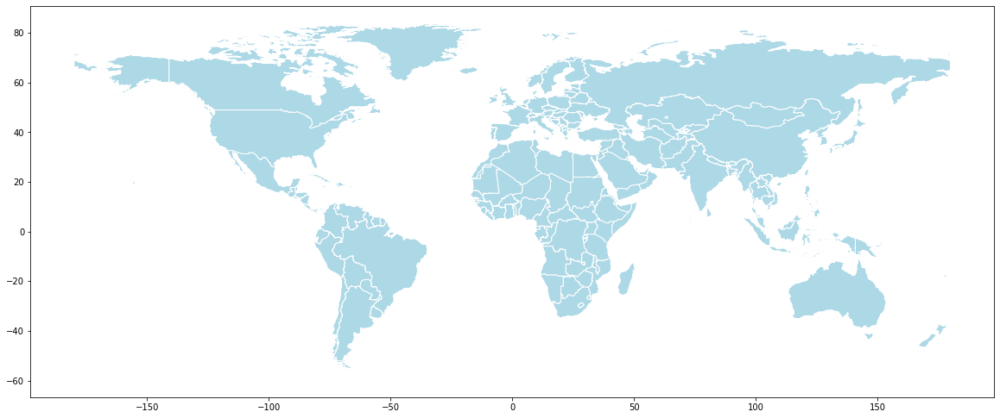

In [ ]:
geo_df = geo_df.drop(geo_df.loc[geo_df['country'] == 'Antarctica'].index)
geo_df.plot(figsize=(20, 20), edgecolor='white', linewidth=1, color='lightblue')

In [ ]:
iso3_codes = geo_df['country'].to_list()

# Convert to iso3_codes
iso2_codes_list = coco.convert(names=iso3_codes, to='ISO2', not_found='NULL')

# Add the list with iso2 codes to the dataframe
geo_df['iso2_code'] = iso2_codes_list

# There are some countries for which the converter could not find a country code. 
# We will drop these countries.
geo_df = geo_df.drop(geo_df.loc[geo_df['iso2_code'] == 'NULL'].index)

Dhekelia Sovereign Base Area not found in regex
US Naval Base Guantanamo Bay not found in regex
Siachen Glacier not found in regex
Baykonur Cosmodrome not found in regex
Akrotiri Sovereign Base Area not found in regex
Southern Patagonian Ice Field not found in regex
Bir Tawil not found in regex
Indian Ocean Territories not found in regex
Coral Sea Islands not found in regex
Spratly Islands not found in regex
Clipperton Island not found in regex
Ashmore and Cartier Islands not found in regex
Bajo Nuevo Bank (Petrel Is.) not found in regex
Serranilla Bank not found in regex
Scarborough Reef not found in regex


In [ ]:
df = pd.merge(left=geo_df, right=combined_codes, how='left', left_on='country_code', right_on='Code')

In [ ]:
df.dropna(inplace=True)
df

,country,country_code,geometry,iso2_code,Code,stringency_index,Country,Avg_PSS,Avg_Trust,Avg_concern,SPS_avg,Avg_compliance,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,Avg_expenditure
0,Indonesia,IDN,"MULTIPOLYGON (((117.70361 4.16341, 117.70361 4...",ID,IDN,49.526591,Indonesia,3.015815,3.986928,4.764563,4.591950,4.653317,26.3,27.6,30.5,31.9,36.1,41.6,46.4,47.2,49.9,..,37.500000
2,Chile,CHL,"MULTIPOLYGON (((-69.51009 -17.50659, -69.50611...",CL,CHL,42.288182,Chile,3.000000,2.568966,5.224138,4.876852,4.698276,59.0,59.5,60.0,59.4,58.9,58.7,58.5,60.1,60.3,60.6,59.377778
7,India,IND,"MULTIPOLYGON (((77.80035 35.49541, 77.81533 35...",IN,IND,57.537879,India,2.950980,5.372549,5.215686,4.695652,4.578431,25.5,28.0,27.1,22.1,22.9,25.8,27.0,27.5,27.2,..,25.900000
9,Israel,ISR,"POLYGON ((34.24835 31.21145, 34.26440 31.22419...",IL,ISR,56.165076,Israel,3.100000,5.100000,4.500000,4.711111,4.675000,62.8,62.6,62.6,63.4,63.1,63.4,63.3,63.9,64.6,64.8,63.300000
21,France,FRA,"MULTIPOLYGON (((-54.11153 2.11427, -54.13491 2...",FR,FRA,56.309167,France,2.863672,3.239170,4.694978,4.882438,4.588897,76.3,76.0,76.1,76.2,76.5,76.6,83.0,83.2,83.5,83.7,78.600000
28,Costa Rica,CRI,"MULTIPOLYGON (((-83.69650 10.93659, -83.68687 ...",CR,CRI,47.138030,Costa Rica,2.977273,6.500000,5.000000,5.195455,4.750000,73.1,73.0,74.1,74.9,73.0,74.8,75.1,75.0,73.8,73.9,74.088889
36,South Africa,ZAF,"MULTIPOLYGON (((19.98145 -24.75249, 19.98641 -...",ZA,ZAF,49.818030,South Africa,2.966981,5.500000,4.933962,4.935309,4.778302,40.9,42.5,43.3,43.2,43.0,42.7,42.9,42.8,43.1,..,42.711111
43,Lithuania,LTU,"MULTIPOLYGON (((26.59453 55.66699, 26.60383 55...",LT,LTU,48.141212,Lithuania,2.925317,4.273873,4.834448,4.957128,4.656584,71.7,71.0,67.3,66.2,67.6,67.1,66.6,66.1,67.2,66.4,67.866667
47,Russia,RUS,"MULTIPOLYGON (((87.81632 49.16584, 87.71638 49...",RU,RUS,50.182955,Russia,3.031250,4.441441,4.473214,4.741762,4.214286,61.4,62.7,63.7,62.4,61.8,58.7,57.0,57.1,59.5,61.2,60.477778
49,Germany,DEU,"MULTIPOLYGON (((13.81572 48.76643, 13.78586 48...",DE,DEU,46.481591,Germany,2.898223,5.056052,4.268982,5.096678,4.425283,83.2,83.1,83.0,83.8,84.2,84.2,84.3,84.5,84.5,84.6,83.866667


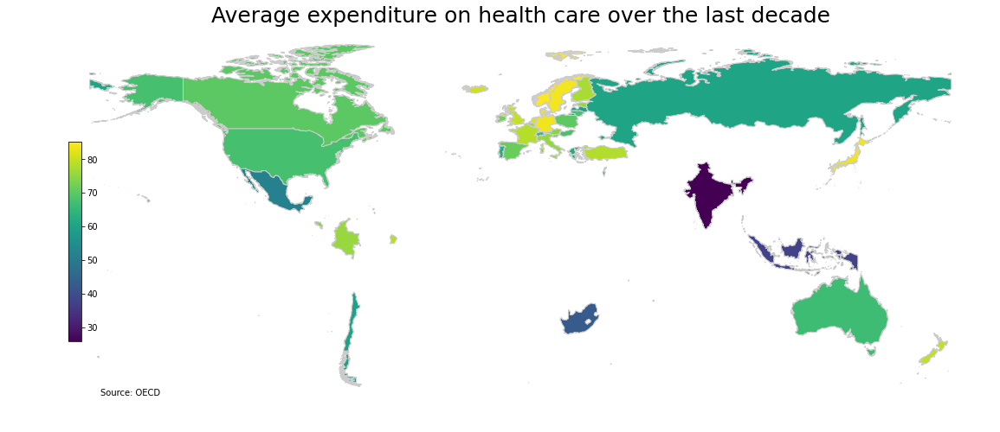

In [ ]:
title = 'Average expenditure on health care over the last decade'
col = 'Avg_expenditure'
vmin = combined_codes[col].min()
vmax = combined_codes[col].max()
source = 'Source: OECD'
cmap = 'viridis'
fig, ax = plt.subplots(1, figsize=(20, 8))

# Remove the axis
ax.axis('off')
df.plot(column=col, ax=ax, edgecolor='0.8', linewidth=1, cmap=cmap)

# Add a title
ax.set_title(title, fontdict={'fontsize': '25', 'fontweight': '3'})

# Create an annotation for the data source
ax.annotate(source, xy=(0.1, .08), xycoords='figure fraction', horizontalalignment='left', 
            verticalalignment='bottom', fontsize=10)
            
# Create colorbar as a legend
sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap=cmap)

# Empty array for the data range
sm._A = []

# Add the colorbar to the figure
cbaxes = fig.add_axes([0.15, 0.25, 0.01, 0.4])
cbar = fig.colorbar(sm, cax=cbaxes)

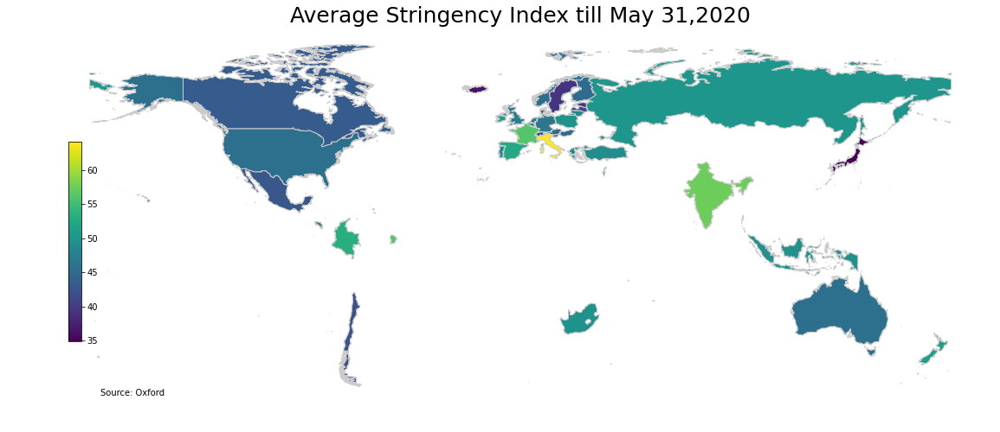

In [ ]:
title = 'Average Stringency Index till May 31,2020'
col = 'stringency_index'
vmin = combined_codes[col].min()
vmax = combined_codes[col].max()
source = 'Source: Oxford'
cmap = 'viridis'
fig, ax = plt.subplots(1, figsize=(20, 8))

# Remove the axis
ax.axis('off')
df.plot(column=col, ax=ax, edgecolor='0.8', linewidth=1, cmap=cmap)

# Add a title
ax.set_title(title, fontdict={'fontsize': '25', 'fontweight': '3'})

# Create an annotation for the data source
ax.annotate(source, xy=(0.1, .08), xycoords='figure fraction', horizontalalignment='left', 
            verticalalignment='bottom', fontsize=10)
            
# Create colorbar as a legend
sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap=cmap)

# Empty array for the data range
sm._A = []

# Add the colorbar to the figure
cbaxes = fig.add_axes([0.15, 0.25, 0.01, 0.4])
cbar = fig.colorbar(sm, cax=cbaxes)

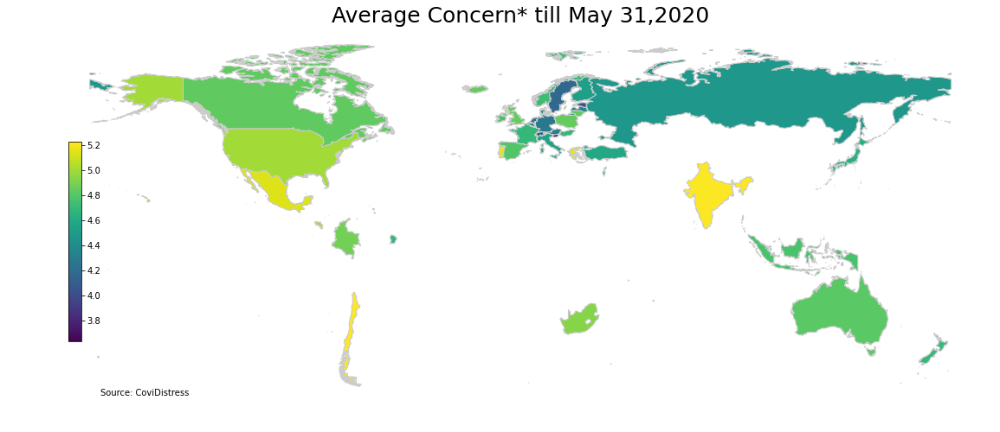

In [ ]:
title = 'Average Concern* till May 31,2020'
col = 'Avg_concern'
vmin = combined_codes[col].min()
vmax = combined_codes[col].max()
source = 'Source: CoviDistress'
cmap = 'viridis'
fig, ax = plt.subplots(1, figsize=(20, 8))

# Remove the axis
ax.axis('off')
df.plot(column=col, ax=ax, edgecolor='0.8', linewidth=1, cmap=cmap)

# Add a title
ax.set_title(title, fontdict={'fontsize': '25', 'fontweight': '3'})

# Create an annotation for the data source
ax.annotate(source, xy=(0.1, .08), xycoords='figure fraction', horizontalalignment='left', 
            verticalalignment='bottom', fontsize=10)
            
# Create colorbar as a legend
sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap=cmap)

# Empty array for the data range
sm._A = []

# Add the colorbar to the figure
cbaxes = fig.add_axes([0.15, 0.25, 0.01, 0.4])
cbar = fig.colorbar(sm, cax=cbaxes)

## Pie Charts

Does not look good >:(

In [ ]:
combined_codes.set_index(combined_codes["Country"],inplace=True)

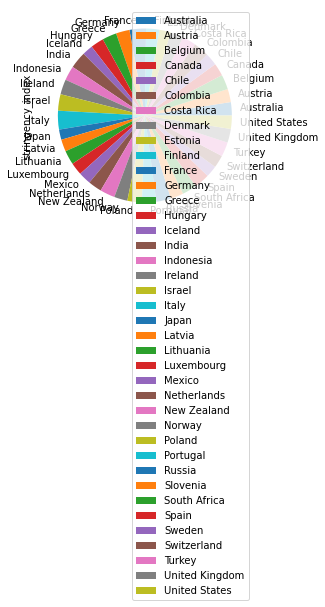

In [ ]:
combined_codes.plot.pie(y="stringency_index")

## Bar Charts

In [ ]:
combined_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39 entries, 0 to 38
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   stringency_index  39 non-null     float64
 1   Country           39 non-null     object 
 2   Avg_PSS           39 non-null     float64
 3   Avg_Trust         39 non-null     float64
 4   Avg_concern       39 non-null     float64
 5   SPS_avg           39 non-null     float64
 6   Avg_compliance    39 non-null     float64
 7   2010              39 non-null     float64
 8   2011              39 non-null     float64
 9   2012              39 non-null     float64
 10  2013              39 non-null     float64
 11  2014              39 non-null     float64
 12  2015              39 non-null     float64
 13  2016              39 non-null     float64
 14  2017              39 non-null     float64
 15  2018              39 non-null     float64
 16  2019              39 non-null     object 
 17 

In [ ]:
combined_final["2019"]=pd.to_numeric(combined_final["2019"],errors='coerce')

In [ ]:
col = ["2010","2011","2012","2013","2014","2015","2016","2017","2018","2019"]

<Figure size 432x288 with 0 Axes>

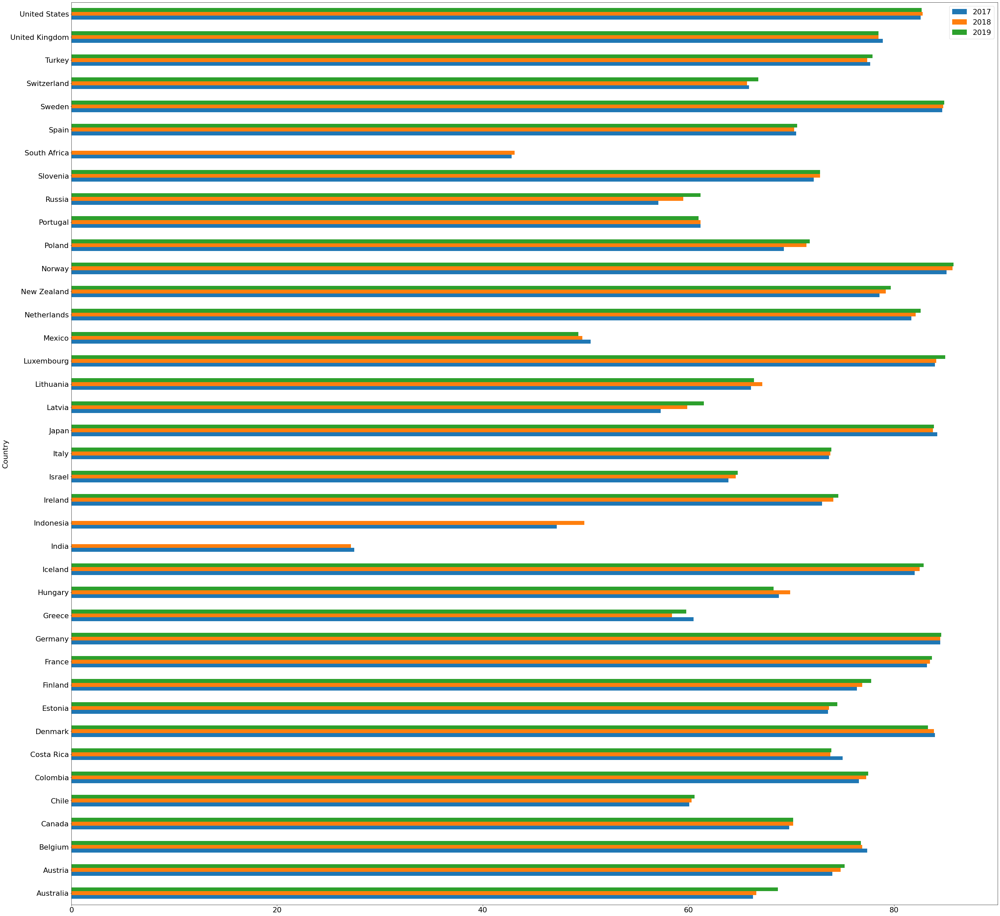

In [ ]:
plt.figure()
plt.rcParams.update({'font.size': 22})
combined_final.plot(x="Country",y=["2017","2018","2019"],kind="barh",figsize=(50,50))

In [ ]:
#combined_final.plot(x="Country",y=["2019"],kind="barh",figsize=(50,50))

# Model

## Data


Join clean_df with healthcare and stringency.

In [ ]:
compiled = pd.merge(clean_df,combined_final)

In [ ]:
compiled.head()

,Unnamed: 0,Dem_age,Dem_gender,Dem_edu,Dem_edu_mom,Dem_employment,Country,Dem_Expat,Dem_state,Dem_maritalstatus,Dem_dependents,Dem_riskgroup,Dem_isolation,Dem_isolation_adults,Dem_isolation_kids,AD_gain,AD_loss,Scale_PSS10_UCLA_1,Scale_PSS10_UCLA_2,Scale_PSS10_UCLA_3,Scale_PSS10_UCLA_4,Scale_PSS10_UCLA_5,Scale_PSS10_UCLA_6,Scale_PSS10_UCLA_7,Scale_PSS10_UCLA_8,Scale_PSS10_UCLA_9,Scale_PSS10_UCLA_10,Scale_SLON_1,Scale_SLON_2,Scale_SLON_3,OECD_people_1,OECD_people_2,OECD_insititutions_1,OECD_insititutions_2,OECD_insititutions_3,OECD_insititutions_4,OECD_insititutions_5,OECD_insititutions_6,Corona_concerns_1,Corona_concerns_2,...,PSS10_avg,Expl_Coping_1,Expl_Coping_2,Expl_Coping_3,Expl_Coping_4,Expl_Coping_5,Expl_Coping_6,Expl_Coping_7,Expl_Coping_8,Expl_Coping_9,Expl_Coping_10,Expl_Coping_11,Expl_Coping_12,Expl_Coping_13,Expl_Coping_14,Expl_Coping_15,Expl_Coping_16,Expl_media_1,Expl_media_2,Expl_media_3,Expl_media_4,Expl_media_5,Expl_media_6,stringency_index,Avg_PSS,Avg_Trust,Avg_concern,SPS_avg,Avg_compliance,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,Avg_expenditure
0,5,68,1,0,0,3,Italy,0,7656,1,0.0,0,4,1,0,0.0,0.0,1,2,3,4,4,2,4,4,2,3,2,2,3,7,7,7,7,8,8,7,8,5,5,...,2.1,5.0,3.0,5.0,3.0,5.0,4.0,2.0,2.0,5.0,4.0,5.0,5.0,4.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,64.064394,2.902606,5.066943,4.534613,4.904343,4.668951,78.5,77.0,75.9,75.8,75.4,74.4,74.4,73.7,73.8,73.9,75.433333
1,180,53,1,0,5,0,Italy,0,4061,1,2.0,0,4,0,0,0.0,0.0,2,2,4,4,4,3,3,4,3,1,3,3,3,7,8,5,6,7,5,5,6,4,4,...,2.4,4.0,5.0,5.0,5.0,4.0,6.0,2.0,2.0,5.0,4.0,4.0,3.0,4.0,3.0,5.0,4.0,5.0,5.0,6.0,4.0,5.0,4.0,64.064394,2.902606,5.066943,4.534613,4.904343,4.668951,78.5,77.0,75.9,75.8,75.4,74.4,74.4,73.7,73.8,73.9,75.433333
2,214,45,1,0,3,4,Italy,0,4125,0,2.0,2,4,0,0,0.0,0.0,1,2,2,4,2,3,4,4,2,3,2,2,1,5,5,8,8,10,5,5,9,2,4,...,2.3,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,5.0,5.0,2.0,2.0,3.0,4.0,4.0,2.0,4.0,3.0,64.064394,2.902606,5.066943,4.534613,4.904343,4.668951,78.5,77.0,75.9,75.8,75.4,74.4,74.4,73.7,73.8,73.9,75.433333
3,230,28,0,5,7,0,Italy,0,4125,1,0.0,0,4,1,0,0.0,0.0,4,3,3,3,2,4,3,3,4,3,4,4,2,5,6,5,5,6,9,10,9,5,5,...,3.4,4.0,2.0,6.0,1.0,3.0,6.0,5.0,5.0,6.0,4.0,3.0,2.0,6.0,6.0,1.0,5.0,2.0,2.0,4.0,4.0,6.0,4.0,64.064394,2.902606,5.066943,4.534613,4.904343,4.668951,78.5,77.0,75.9,75.8,75.4,74.4,74.4,73.7,73.8,73.9,75.433333
4,238,31,0,0,0,4,Italy,0,4125,1,0.0,0,4,0,0,0.0,0.0,3,2,3,4,4,2,4,3,3,3,2,3,3,6,8,3,5,6,7,7,4,5,4,...,2.5,4.0,3.0,5.0,3.0,4.0,5.0,1.0,1.0,5.0,4.0,3.0,5.0,6.0,4.0,2.0,4.0,4.0,1.0,1.0,4.0,5.0,3.0,64.064394,2.902606,5.066943,4.534613,4.904343,4.668951,78.5,77.0,75.9,75.8,75.4,74.4,74.4,73.7,73.8,73.9,75.433333


In [ ]:
col="Country"
labelencoder=label_object[col]
compiled[col] = labelencoder.fit_transform(compiled[col])

In [ ]:
bins = [1,2,3,4,5,6,7,8,9,10]
compiled["PSS10_avg"]=pd.cut(compiled.PSS10_avg,bins=10,labels=bins)
compiled["PSS10_avg"]=compiled["PSS10_avg"].astype(dtype=int)
compiled.dropna(inplace=True)

In [ ]:
compiled = compiled.loc[:, ~compiled.columns.str.contains('^Unnamed')]

In [ ]:
compiled.head()

,Dem_age,Dem_gender,Dem_edu,Dem_edu_mom,Dem_employment,Country,Dem_Expat,Dem_state,Dem_maritalstatus,Dem_dependents,Dem_riskgroup,Dem_isolation,Dem_isolation_adults,Dem_isolation_kids,AD_gain,AD_loss,Scale_PSS10_UCLA_1,Scale_PSS10_UCLA_2,Scale_PSS10_UCLA_3,Scale_PSS10_UCLA_4,Scale_PSS10_UCLA_5,Scale_PSS10_UCLA_6,Scale_PSS10_UCLA_7,Scale_PSS10_UCLA_8,Scale_PSS10_UCLA_9,Scale_PSS10_UCLA_10,Scale_SLON_1,Scale_SLON_2,Scale_SLON_3,OECD_people_1,OECD_people_2,OECD_insititutions_1,OECD_insititutions_2,OECD_insititutions_3,OECD_insititutions_4,OECD_insititutions_5,OECD_insititutions_6,Corona_concerns_1,Corona_concerns_2,Corona_concerns_3,...,PSS10_avg,Expl_Coping_1,Expl_Coping_2,Expl_Coping_3,Expl_Coping_4,Expl_Coping_5,Expl_Coping_6,Expl_Coping_7,Expl_Coping_8,Expl_Coping_9,Expl_Coping_10,Expl_Coping_11,Expl_Coping_12,Expl_Coping_13,Expl_Coping_14,Expl_Coping_15,Expl_Coping_16,Expl_media_1,Expl_media_2,Expl_media_3,Expl_media_4,Expl_media_5,Expl_media_6,stringency_index,Avg_PSS,Avg_Trust,Avg_concern,SPS_avg,Avg_compliance,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,Avg_expenditure
0,68,1,0,0,3,19,0,7656,1,0.0,0,4,1,0,0.0,0.0,1,2,3,4,4,2,4,4,2,3,2,2,3,7,7,7,7,8,8,7,8,5,5,5,...,3,5.0,3.0,5.0,3.0,5.0,4.0,2.0,2.0,5.0,4.0,5.0,5.0,4.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,64.064394,2.902606,5.066943,4.534613,4.904343,4.668951,78.5,77.0,75.9,75.8,75.4,74.4,74.4,73.7,73.8,73.9,75.433333
1,53,1,0,5,0,19,0,4061,1,2.0,0,4,0,0,0.0,0.0,2,2,4,4,4,3,3,4,3,1,3,3,3,7,8,5,6,7,5,5,6,4,4,4,...,4,4.0,5.0,5.0,5.0,4.0,6.0,2.0,2.0,5.0,4.0,4.0,3.0,4.0,3.0,5.0,4.0,5.0,5.0,6.0,4.0,5.0,4.0,64.064394,2.902606,5.066943,4.534613,4.904343,4.668951,78.5,77.0,75.9,75.8,75.4,74.4,74.4,73.7,73.8,73.9,75.433333
2,45,1,0,3,4,19,0,4125,0,2.0,2,4,0,0,0.0,0.0,1,2,2,4,2,3,4,4,2,3,2,2,1,5,5,8,8,10,5,5,9,2,4,3,...,4,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,5.0,5.0,2.0,2.0,3.0,4.0,4.0,2.0,4.0,3.0,64.064394,2.902606,5.066943,4.534613,4.904343,4.668951,78.5,77.0,75.9,75.8,75.4,74.4,74.4,73.7,73.8,73.9,75.433333
3,28,0,5,7,0,19,0,4125,1,0.0,0,4,1,0,0.0,0.0,4,3,3,3,2,4,3,3,4,3,4,4,2,5,6,5,5,6,9,10,9,5,5,4,...,6,4.0,2.0,6.0,1.0,3.0,6.0,5.0,5.0,6.0,4.0,3.0,2.0,6.0,6.0,1.0,5.0,2.0,2.0,4.0,4.0,6.0,4.0,64.064394,2.902606,5.066943,4.534613,4.904343,4.668951,78.5,77.0,75.9,75.8,75.4,74.4,74.4,73.7,73.8,73.9,75.433333
4,31,0,0,0,4,19,0,4125,1,0.0,0,4,0,0,0.0,0.0,3,2,3,4,4,2,4,3,3,3,2,3,3,6,8,3,5,6,7,7,4,5,4,4,...,4,4.0,3.0,5.0,3.0,4.0,5.0,1.0,1.0,5.0,4.0,3.0,5.0,6.0,4.0,2.0,4.0,4.0,1.0,1.0,4.0,5.0,3.0,64.064394,2.902606,5.066943,4.534613,4.904343,4.668951,78.5,77.0,75.9,75.8,75.4,74.4,74.4,73.7,73.8,73.9,75.433333


In [ ]:
compiled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57323 entries, 0 to 58247
Data columns (total 89 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Dem_age               57323 non-null  int64  
 1   Dem_gender            57323 non-null  int64  
 2   Dem_edu               57323 non-null  int64  
 3   Dem_edu_mom           57323 non-null  int64  
 4   Dem_employment        57323 non-null  int64  
 5   Country               57323 non-null  int64  
 6   Dem_Expat             57323 non-null  int64  
 7   Dem_state             57323 non-null  int64  
 8   Dem_maritalstatus     57323 non-null  int64  
 9   Dem_dependents        57323 non-null  float64
 10  Dem_riskgroup         57323 non-null  int64  
 11  Dem_isolation         57323 non-null  int64  
 12  Dem_isolation_adults  57323 non-null  int64  
 13  Dem_isolation_kids    57323 non-null  int64  
 14  AD_gain               57323 non-null  float64
 15  AD_loss            

## Feature Selection

[0.0189516  0.01010855 0.01381487 0.01563648 0.01442882 0.00695632
 0.00704333 0.01657549 0.0125998  0.01268637 0.01151501 0.01095006
 0.01424682 0.01008559 0.00837861 0.0093994  0.02117577 0.02618538
 0.02272146 0.01707693 0.01583638 0.01597999 0.01670662 0.01664256
 0.01601116 0.01568422 0.01598245 0.01645427 0.01482243 0.01470995
 0.01398539 0.01404782 0.01484575 0.01376793 0.01388671 0.01384018
 0.01739229 0.01565168 0.01563954 0.0145507  0.01560659 0.01450029
 0.01554524 0.01540836 0.01559015 0.0146645  0.01437957 0.01498771
 0.01508402 0.01557797 0.01476357 0.01589408 0.01516424 0.01374285
 0.01454399 0.0152436  0.01528532 0.0156857  0.01600669 0.01598126
 0.01632397 0.0071813  0.00723651 0.00625506 0.00862108 0.00580861
 0.00577761 0.00572253 0.00571526 0.00578409 0.00577496 0.00584891
 0.00586607 0.00582754 0.00588334 0.00574279]


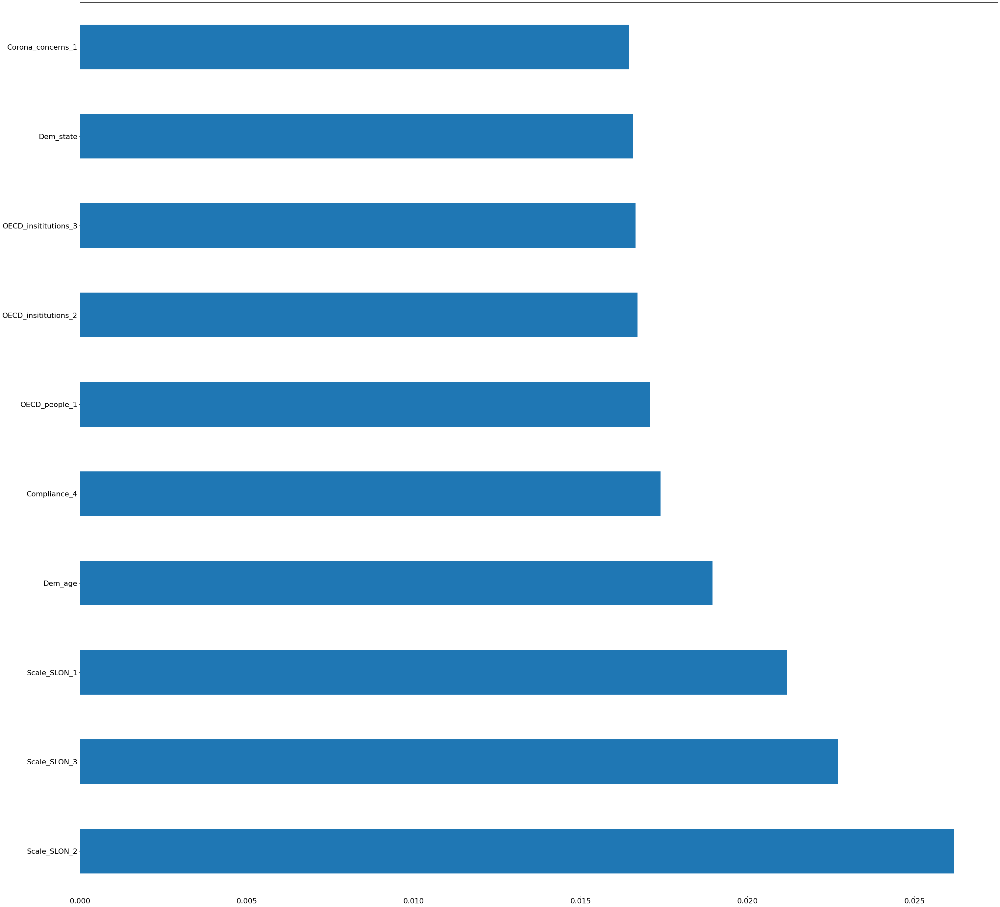

In [ ]:
Y=compiled.loc[:,"PSS10_avg"]
compiled = compiled.loc[:,~compiled.columns.str.contains('^Scale_PSS10')]
X = compiled.loc[:, ((compiled.columns != 'Avg_PSS')&(compiled.columns != 'SPS_avg')&(compiled.columns != 'PSS10_avg')) ]
model = ExtraTreesClassifier()
model.fit(X,Y)
print(model.feature_importances_)
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh',figsize=(50,50))
plt.show()

In [ ]:
col1=feat_importances.index.to_list()
X = compiled.loc[:,col1]
Y = compiled["PSS10_avg"]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=42)
model.fit(X_train,y_train)
preds=model.predict(X_test)
print(f1_score(preds,y_test,average='weighted'))
print(cohen_kappa_score(preds,y_test))


0.2884731759216854
0.12638928567034047


[0.04993235 0.10062403 0.06857649 0.0827198  0.08405944 0.09068567
 0.0657388  0.06561079 0.04627554 0.05158186 0.04675359 0.04359736
 0.0564876  0.04482705 0.04762651 0.05490312]


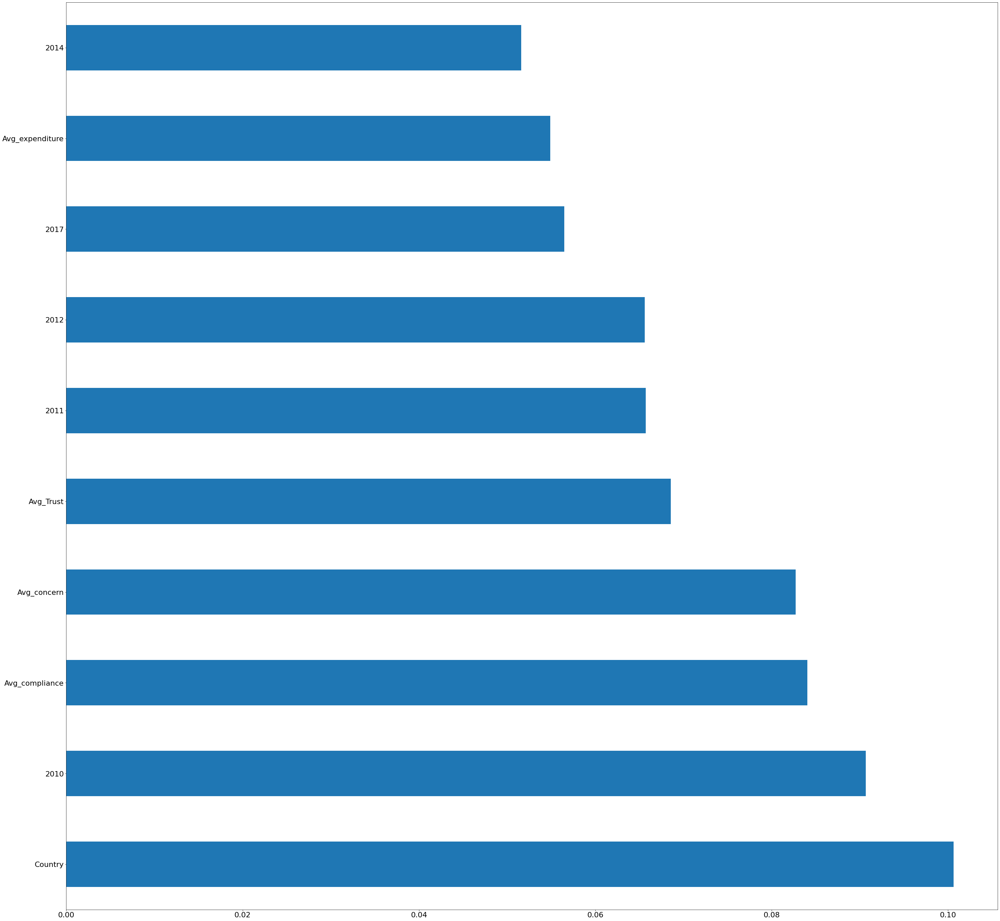

In [ ]:
col="Country"
labelencoder=label_object[col]
combined_final[col] = labelencoder.fit_transform(combined_final[col])
combined_final["Avg_PSS"]=combined_final["Avg_PSS"].astype(dtype=float)
#combined_final["Avg_PSS"]=combined_final["Avg_PSS"].round(decimals=0)
combined_final["Avg_PSS"]=pd.cut(combined_final["Avg_PSS"],bins=10,labels=[1,2,3,4,5,6,7,8,9,10])
combined_final.dropna(inplace=True)
Y=combined_final.loc[:,"Avg_PSS"]
X = combined_final.loc[:, ((combined_final.columns != 'Avg_PSS')&(combined_final.columns != 'SPS_avg')) ]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=42)
model = ExtraTreesClassifier()
model.fit(X,Y)
print(model.feature_importances_)
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh',figsize=(50,50))
plt.show()

In [ ]:
combined_final["Avg_PSS"].value_counts()

5     9
6     7
4     7
3     3
9     2
8     2
7     2
1     2
10    1
2     1
Name: Avg_PSS, dtype: int64

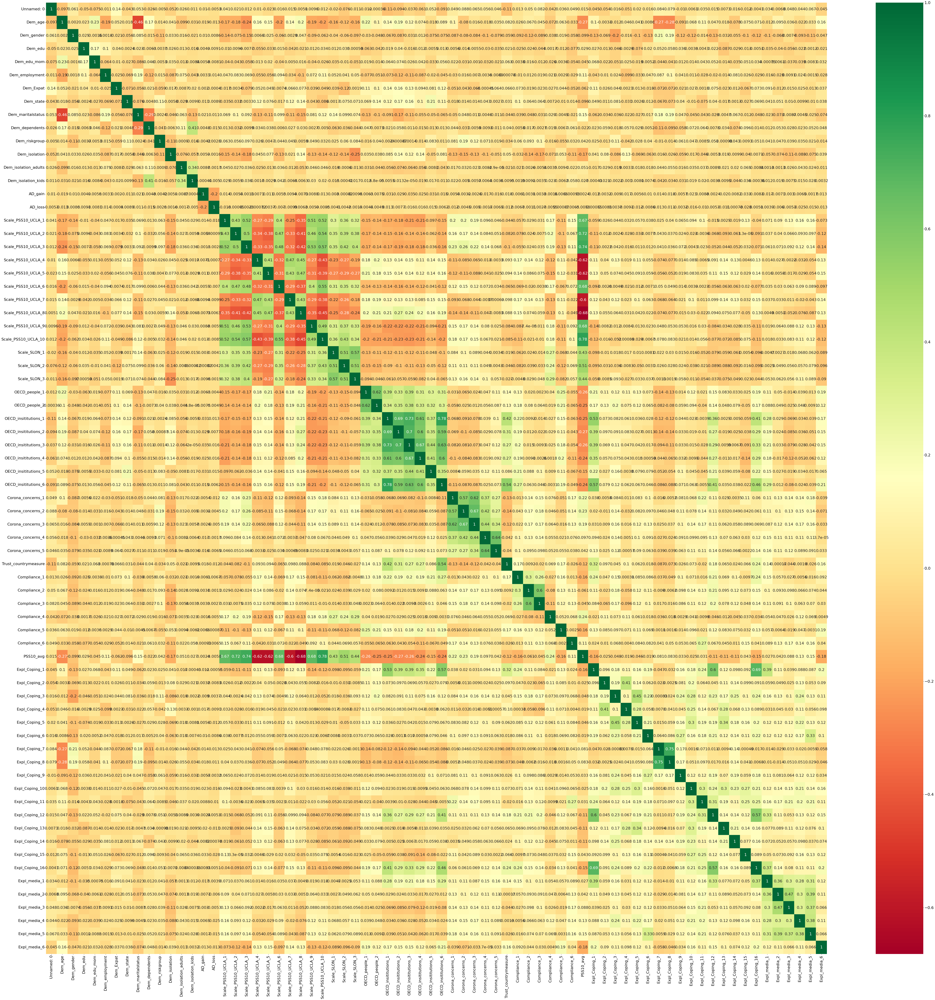

In [ ]:
corrmat = clean_df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(100,100))
#plot heat map
g=sns.heatmap(clean_df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [ ]:
Y=compiled.loc[:,"PSS10_avg"]
X = compiled.loc[:, compiled.columns != 'PSS10_avg' ]
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,Y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score')) 

                   Specs          Score
7              Dem_state  735204.932053
0                Dem_age   18510.150068
17          Scale_SLON_2    8803.562815
16          Scale_SLON_1    6406.100208
5                Country    6005.723933
26  OECD_insititutions_6    5789.224461
18          Scale_SLON_3    5710.965322
21  OECD_insititutions_1    5450.809044
22  OECD_insititutions_2    5381.594068
23  OECD_insititutions_3    4177.519597


In [ ]:
Y=combined_final.loc[:,"Avg_PSS"]
X = combined_final.loc[:, combined_final.columns != 'Avg_PSS' ]
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,Y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))

              Specs      Score
1           Country  98.472819
6              2010  21.367649
7              2011  17.974413
8              2012  17.524525
12             2016  16.956544
13             2017  16.804173
16  Avg_expenditure  15.837548
9              2013  15.616100
14             2018  15.463100
15             2019  15.301514


# Select best features

In [ ]:
col1=feat_importances.index.to_list()
X = compiled.loc[:,col1]
Y = compiled["PSS10_avg"]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

# Mord model

In [ ]:
c = m.LogisticIT(alpha=1.5) #Default parameters: alpha=1.0, verbose=0, maxiter=10000
c.fit(X_train,y_train)

LogisticIT(alpha=1.5)

In [ ]:
preds=c.predict(X_test)
print(cohen_kappa_score(preds,y_test))

0.02205842019775628


In [ ]:
c2=m.multiClassClassification(max_iter=50000)
c2.fit(X_train,y_train)
preds2=c.predict(X_test)
print(cohen_kappa_score(preds2,y_test))

In [ ]:
from pycaret.classification import*
compiled = compiled.loc[:,~compiled.columns.str.contains('^Scale_PSS10')]
compiled = compiled.loc[:, ((compiled.columns != 'Avg_PSS')&(compiled.columns != 'SPS_avg')) ]
col1=feat_importances.index.to_list()
col1+=["PSS10_avg"]
dataset = compiled.loc[:,col1]
ord_features=dict()
for col in dataset.columns:
  if col not in ["Dem_state","Dem_age","stringency_index","PSS10_avg"]:
    ord_features[col]=sorted(list(dataset[col].unique()))
print(ord_features)
clf1 = setup(data = dataset, target = 'PSS10_avg', ordinal_features = ord_features)
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.2174,0.5735,0.1153,0.1645,0.1566,0.0340,0.0383,1.589
dt,Decision Tree Classifier,0.2173,0.5730,0.1153,0.1810,0.1565,0.0339,0.0382,0.093
et,Extra Trees Classifier,0.2173,0.5730,0.1153,0.1810,0.1565,0.0339,0.0382,1.301
lightgbm,Light Gradient Boosting Machine,0.2172,0.5731,0.1152,0.1553,0.1563,0.0338,0.0380,4.516
ada,Ada Boost Classifier,0.2168,0.5657,0.1147,0.1547,0.1568,0.0327,0.0370,1.537
gbc,Gradient Boosting Classifier,0.2168,0.5731,0.1148,0.1713,0.1560,0.0330,0.0372,32.808
ridge,Ridge Classifier,0.2136,0.0000,0.1145,0.1428,0.1551,0.0320,0.0351,0.061
lda,Linear Discriminant Analysis,0.2136,0.5685,0.1151,0.1496,0.1584,0.0329,0.0359,0.119
lr,Logistic Regression,0.2134,0.5664,0.1140,0.1329,0.1515,0.0312,0.0343,23.949
dummy,Dummy Classifier,0.2013,0.5000,0.1000,0.0405,0.0674,0.0000,0.0000,0.047


In [ ]:
from pycaret.regression import*
compiled = compiled.loc[:,~compiled.columns.str.contains('^Scale_PSS10')]
compiled = compiled.loc[:, ((compiled.columns != 'Avg_PSS')&(compiled.columns != 'SPS_avg')) ]
col1=feat_importances.index.to_list()
col1+=["PSS10_avg"]
dataset = compiled.loc[:,col1]
ord_features=dict()
for col in dataset.columns:
  if col not in ["Dem_state","Dem_age","stringency_index","PSS10_avg"]:
    ord_features[col]=sorted(list(dataset[col].unique()))
print(ord_features)
reg1 = setup(data = dataset, target = 'PSS10_avg', ordinal_features = ord_features)
best_model = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
dt,Decision Tree Regressor,1.4461,3.2360,1.7988,0.0680,0.3738,0.5023,0.063
gbr,Gradient Boosting Regressor,1.4461,3.2359,1.7988,0.0680,0.3738,0.5023,2.097
rf,Random Forest Regressor,1.4461,3.2360,1.7988,0.0680,0.3738,0.5023,2.641
lightgbm,Light Gradient Boosting Machine,1.4461,3.2359,1.7988,0.0680,0.3738,0.5022,0.427
et,Extra Trees Regressor,1.4461,3.2360,1.7988,0.0680,0.3738,0.5023,1.794
lr,Linear Regression,1.4527,3.2683,1.8077,0.0587,0.3758,0.5057,0.407
ridge,Ridge Regression,1.4527,3.2683,1.8077,0.0587,0.3758,0.5057,0.033
br,Bayesian Ridge,1.4528,3.2683,1.8078,0.0587,0.3758,0.5057,0.044
ada,AdaBoost Regressor,1.4741,3.2743,1.8094,0.0569,0.3816,0.5313,0.520
huber,Huber Regressor,1.4555,3.2820,1.8115,0.0547,0.3734,0.4947,0.494


# DECISION TREE 

# PREPROCESSING

In [ ]:
clean_cd_df = pd.read_csv("/content/drive/MyDrive/DA_Project_files/All_datasets/Covidistress_final.csv")
health_expend_df = pd.read_csv("/content/drive/MyDrive/DA_Project_files/All_datasets/Healthcare_expenditure.csv")
string_ind_df = pd.read_csv("/content/drive/MyDrive/DA_Project_files/All_datasets/covid-stringency-index.csv")


In [ ]:
clean_cd_df.columns

Index(['Unnamed: 0', 'Dem_age', 'Dem_gender', 'Dem_edu', 'Dem_edu_mom',
       'Dem_employment', 'Country', 'Dem_Expat', 'Dem_state',
       'Dem_maritalstatus', 'Dem_dependents', 'Dem_riskgroup', 'Dem_isolation',
       'Dem_isolation_adults', 'Dem_isolation_kids', 'AD_gain', 'AD_loss',
       'Scale_PSS10_UCLA_1', 'Scale_PSS10_UCLA_2', 'Scale_PSS10_UCLA_3',
       'Scale_PSS10_UCLA_4', 'Scale_PSS10_UCLA_5', 'Scale_PSS10_UCLA_6',
       'Scale_PSS10_UCLA_7', 'Scale_PSS10_UCLA_8', 'Scale_PSS10_UCLA_9',
       'Scale_PSS10_UCLA_10', 'Scale_SLON_1', 'Scale_SLON_2', 'Scale_SLON_3',
       'OECD_people_1', 'OECD_people_2', 'OECD_insititutions_1',
       'OECD_insititutions_2', 'OECD_insititutions_3', 'OECD_insititutions_4',
       'OECD_insititutions_5', 'OECD_insititutions_6', 'Corona_concerns_1',
       'Corona_concerns_2', 'Corona_concerns_3', 'Corona_concerns_4',
       'Corona_concerns_5', 'Trust_countrymeasure', 'Compliance_1',
       'Compliance_2', 'Compliance_3', 'Compliance_4', '

In [ ]:
clean_cd_df.head()

,Unnamed: 0,Dem_age,Dem_gender,Dem_edu,Dem_edu_mom,Dem_employment,Country,Dem_Expat,Dem_state,Dem_maritalstatus,Dem_dependents,Dem_riskgroup,Dem_isolation,Dem_isolation_adults,Dem_isolation_kids,AD_gain,AD_loss,Scale_PSS10_UCLA_1,Scale_PSS10_UCLA_2,Scale_PSS10_UCLA_3,Scale_PSS10_UCLA_4,Scale_PSS10_UCLA_5,Scale_PSS10_UCLA_6,Scale_PSS10_UCLA_7,Scale_PSS10_UCLA_8,Scale_PSS10_UCLA_9,Scale_PSS10_UCLA_10,Scale_SLON_1,Scale_SLON_2,Scale_SLON_3,OECD_people_1,OECD_people_2,OECD_insititutions_1,OECD_insititutions_2,OECD_insititutions_3,OECD_insititutions_4,OECD_insititutions_5,OECD_insititutions_6,Corona_concerns_1,Corona_concerns_2,Corona_concerns_3,Corona_concerns_4,Corona_concerns_5,Trust_countrymeasure,Compliance_1,Compliance_2,Compliance_3,Compliance_4,Compliance_5,Compliance_6,PSS10_avg,Expl_Coping_1,Expl_Coping_2,Expl_Coping_3,Expl_Coping_4,Expl_Coping_5,Expl_Coping_6,Expl_Coping_7,Expl_Coping_8,Expl_Coping_9,Expl_Coping_10,Expl_Coping_11,Expl_Coping_12,Expl_Coping_13,Expl_Coping_14,Expl_Coping_15,Expl_Coping_16,Expl_media_1,Expl_media_2,Expl_media_3,Expl_media_4,Expl_media_5,Expl_media_6
0,0,29,Female,"College degree, bachelor, master",Some College or equivalent,Not employed,Argentina,yes,Tucumán,Single,0.0,Yes,Isolated,4,0,0.0,0.0,5,2,5,4,4,1,3,5,3,5,2,5,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.900000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,20,Male,"College degree, bachelor, master",None,Student,Pakistan,yes,<U+0622><U+0632><U+0627><U+062F> <U+06A9><U+06...,Single,0.0,Yes,Life carries on with minor changes,0,0,0.0,0.0,3,3,1,5,2,3,4,4,2,1,3,1,3,3,10,5,4,4,2,4,5,1,2,4,4,5,5,6,3,3,2,4,2,2.200000,4.0,5.0,5.0,3.0,5.0,4.0,2.0,2.0,3.0,5.0,3.0,4.0,5.0,5.0,5.0,3.0,1.0,2.0,3.0,4.0,2.0,3.0
2,2,47,Female,"Some College, short continuing education or eq...",Some College or equivalent,Self-employed,Argentina,no,Córdoba,Single,0.0,No,Isolated,0,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,79,Male,"College degree, bachelor, master",College degree,Not employed,Bulgaria,no,Lovech,Divorced/widowed,0.0,Yes,Life carries on with minor changes,1,0,0.0,0.0,3,5,3,3,3,5,2,3,3,4,5,3,4,4,8,0,5,2,4,0,2,3,0,0,0,0,5,3,5,5,2,2,4,3.600000,4.0,NaN,4.0,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,1.0,NaN,NaN,2.0,2.0,2.0,5.0,5.0,2.0,5.0,4.0
4,4,61,Female,"Some College, short continuing education or eq...",Up to 12 years of school,Retired,Argentina,no,Mendoza,Married/cohabiting,0.0,Yes,Isolated,1,0,0.0,0.0,3,3,2,0,3,0,5,2,0,3,1,1,0,8,8,9,8,5,9,6,9,4,4,3,6,0,5,6,6,0,4,5,5,2.714286,6.0,NaN,6.0,2.0,6.0,3.0,5.0,6.0,5.0,5.0,6.0,6.0,5.0,6.0,6.0,3.0,5.0,5.0,6.0,2.0,2.0,6.0


In [ ]:
clean_cd_df['avg_stress'] = (clean_cd_df['Scale_PSS10_UCLA_1']+ clean_cd_df['Scale_PSS10_UCLA_1']+clean_cd_df['Scale_PSS10_UCLA_2']+clean_cd_df['Scale_PSS10_UCLA_3']+clean_cd_df['Scale_PSS10_UCLA_4']+clean_cd_df['Scale_PSS10_UCLA_5']+clean_cd_df['Scale_PSS10_UCLA_6']+clean_cd_df['Scale_PSS10_UCLA_7']+clean_cd_df['Scale_PSS10_UCLA_8']+clean_cd_df['Scale_PSS10_UCLA_9']+clean_cd_df['Scale_PSS10_UCLA_10'])/10

In [ ]:
#deleting rows with zero stress 
clean_cd_df.shape

(125306, 74)

In [ ]:
clean_cd_df = clean_cd_df.loc[clean_cd_df['avg_stress'] != 0]

In [ ]:
health_expend_df = health_expend_df.drop(health_expend_df.index[0])

In [ ]:
health_expend_df = health_expend_df.drop(labels = ['Unnamed: 1','Unnamed: 2', 'Unnamed: 3'] , axis = 1)

In [ ]:
health_expend_df.fillna(0)

,Year,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
1,Australia,68.6,69.2,67.5,65.0,64.7,65.8,66.0,66.3,66.6,68.7,..
2,Austria,74.6,74.6,74.7,74.0,74.0,74.1,74.0,74.0,74.8,75.2,76.4
3,Belgium,76.1,76.1,76.6,76.1,76.4,75.9,77.3,77.4,76.9,76.8,..
4,Canada,69.9,70.2,70.4,70.7,70.6,70.6,69.7,69.8,70.2,70.2,..
5,Chile,59.0,59.5,60.0,59.4,58.9,58.7,58.5,60.1,60.3,60.6,62.8
6,Colombia,74.8,76.0,73.9,75.6,76.2,76.3,76.1,76.6,77.3,77.5,..
7,Costa Rica,73.1,73.0,74.1,74.9,73.0,74.8,75.1,75.0,73.8,73.9,..
8,Czech Republic,83.3,83.9,83.7,83.6,82.7,82.4,82.0,82.1,83.0,81.8,..
9,Denmark,83.9,83.6,84.0,84.3,84.2,84.2,84.1,84.0,83.9,83.3,..
10,Estonia,76.3,76.7,76.7,75.6,75.7,75.6,75.7,73.6,73.7,74.5,78.2


In [ ]:
health_expend_df = health_expend_df.replace('..', int(0))

In [ ]:
health_expend_df  = health_expend_df.astype({'2019':'float64'})

In [ ]:
health_expend_new_df = pd.DataFrame()
health_expend_new_df['Country'] = health_expend_df['Year']

health_expend_new_df['Avg_10-19'] = health_expend_df.mean(axis = 1)

In [ ]:
health_expend_new_df.head()

,Country,Avg_10-19
1,Australia,66.84
2,Austria,74.40
3,Belgium,76.56
4,Canada,70.23
5,Chile,59.50


In [ ]:
combined_new_df = pd.DataFrame()
combined_new_df = pd.merge(left = clean_cd_df, right = health_expend_new_df, how = 'left', left_on = 'Country', right_on = 'Country')

In [ ]:
string_ind_df["Day"]=pd.to_datetime(string_ind_df["Day"])

In [ ]:
string_ind_df=string_ind_df[(pd.DatetimeIndex(string_ind_df["Day"]).year==2020)&(pd.DatetimeIndex(string_ind_df["Day"]).month<6)]

In [ ]:
string_ind_df = string_ind_df.groupby("Entity")["stringency_index"].mean()

In [ ]:
combined_new_df = pd.merge(left = combined_new_df, right = string_ind_df, how = 'left', left_on= 'Country', right_on = 'Entity')

In [ ]:
combined_new_df = combined_new_df.drop('Dem_state', axis = 1)

In [ ]:
combined_new_df = combined_new_df.drop(labels = ['Scale_PSS10_UCLA_1', 'Scale_PSS10_UCLA_2', 'Scale_PSS10_UCLA_3',
       'Scale_PSS10_UCLA_4', 'Scale_PSS10_UCLA_5', 'Scale_PSS10_UCLA_6',
       'Scale_PSS10_UCLA_7', 'Scale_PSS10_UCLA_8', 'Scale_PSS10_UCLA_9',
       'Scale_PSS10_UCLA_10',], axis = 1)

In [ ]:
new_list = ['Expl_Coping_1', 'Expl_Coping_2', 'Expl_Coping_3', 'Expl_Coping_4',
       'Expl_Coping_5', 'Expl_Coping_6', 'Expl_Coping_7', 'Expl_Coping_8',
       'Expl_Coping_9', 'Expl_Coping_10', 'Expl_Coping_11', 'Expl_Coping_12',
       'Expl_Coping_13', 'Expl_Coping_14', 'Expl_Coping_15', 'Expl_Coping_16']

combined_new_df['Avg_Coping'] = combined_new_df['Expl_Coping_1']
for i in new_list:
  combined_new_df['Avg_Coping'] += combined_new_df[i]/16

In [ ]:
combined_new_df = combined_new_df.drop(labels = ['Expl_Coping_1', 'Expl_Coping_2', 'Expl_Coping_3', 'Expl_Coping_4',
       'Expl_Coping_5', 'Expl_Coping_6', 'Expl_Coping_7', 'Expl_Coping_8',
       'Expl_Coping_9', 'Expl_Coping_10', 'Expl_Coping_11', 'Expl_Coping_12',
       'Expl_Coping_13', 'Expl_Coping_14', 'Expl_Coping_15', 'Expl_Coping_16'], axis = 1)

# Label Encoding Categorical Variables

In [ ]:
combined_new_df_cat =combined_new_df.select_dtypes(['object']).apply(pd.Series.astype,dtype='category')

In [ ]:
cols=combined_new_df_cat.select_dtypes(['category']).columns.to_list()

In [ ]:
combined_new_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 116097 entries, 0 to 116096
Data columns (total 50 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            116097 non-null  int64  
 1   Dem_age               116097 non-null  int64  
 2   Dem_gender            115840 non-null  object 
 3   Dem_edu               115421 non-null  object 
 4   Dem_edu_mom           114326 non-null  object 
 5   Dem_employment        115181 non-null  object 
 6   Country               115723 non-null  object 
 7   Dem_Expat             115569 non-null  object 
 8   Dem_maritalstatus     115362 non-null  object 
 9   Dem_dependents        112872 non-null  float64
 10  Dem_riskgroup         115727 non-null  object 
 11  Dem_isolation         114720 non-null  object 
 12  Dem_isolation_adults  116097 non-null  int64  
 13  Dem_isolation_kids    116097 non-null  int64  
 14  AD_gain               116097 non-null  float64
 15  

In [ ]:
combined_new_df_cat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 116097 entries, 0 to 116096
Data columns (total 9 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   Dem_gender         115840 non-null  category
 1   Dem_edu            115421 non-null  category
 2   Dem_edu_mom        114326 non-null  category
 3   Dem_employment     115181 non-null  category
 4   Country            115723 non-null  category
 5   Dem_Expat          115569 non-null  category
 6   Dem_maritalstatus  115362 non-null  category
 7   Dem_riskgroup      115727 non-null  category
 8   Dem_isolation      114720 non-null  category
dtypes: category(9)
memory usage: 2.0 MB


In [ ]:
combined_new_df_nona = combined_new_df_cat.dropna(how = "any")

In [ ]:
combined_new_df_nona.shape

(110634, 9)

In [ ]:
combined_new_df.columns

Index(['Unnamed: 0', 'Dem_age', 'Dem_gender', 'Dem_edu', 'Dem_edu_mom',
       'Dem_employment', 'Country', 'Dem_Expat', 'Dem_maritalstatus',
       'Dem_dependents', 'Dem_riskgroup', 'Dem_isolation',
       'Dem_isolation_adults', 'Dem_isolation_kids', 'AD_gain', 'AD_loss',
       'Scale_SLON_1', 'Scale_SLON_2', 'Scale_SLON_3', 'OECD_people_1',
       'OECD_people_2', 'OECD_insititutions_1', 'OECD_insititutions_2',
       'OECD_insititutions_3', 'OECD_insititutions_4', 'OECD_insititutions_5',
       'OECD_insititutions_6', 'Corona_concerns_1', 'Corona_concerns_2',
       'Corona_concerns_3', 'Corona_concerns_4', 'Corona_concerns_5',
       'Trust_countrymeasure', 'Compliance_1', 'Compliance_2', 'Compliance_3',
       'Compliance_4', 'Compliance_5', 'Compliance_6', 'PSS10_avg',
       'Expl_media_1', 'Expl_media_2', 'Expl_media_3', 'Expl_media_4',
       'Expl_media_5', 'Expl_media_6', 'avg_stress', 'Avg_10-19',
       'stringency_index', 'Avg_Coping'],
      dtype='object')

In [ ]:
for k in combined_new_df_nona.columns:
 print(k, combined_new_df_nona[k].isnull().values.any())

Dem_gender False
Dem_edu False
Dem_edu_mom False
Dem_employment False
Country False
Dem_Expat False
Dem_maritalstatus False
Dem_riskgroup False
Dem_isolation False


In [ ]:
combined_new_df_nona.head()

,Dem_gender,Dem_edu,Dem_edu_mom,Dem_employment,Country,Dem_Expat,Dem_maritalstatus,Dem_riskgroup,Dem_isolation
0,Female,"College degree, bachelor, master",Some College or equivalent,Not employed,Argentina,yes,Single,Yes,Isolated
1,Male,"College degree, bachelor, master",None,Student,Pakistan,yes,Single,Yes,Life carries on with minor changes
2,Male,"College degree, bachelor, master",College degree,Not employed,Bulgaria,no,Divorced/widowed,Yes,Life carries on with minor changes
3,Female,"Some College, short continuing education or eq...",Up to 12 years of school,Retired,Argentina,no,Married/cohabiting,Yes,Isolated
4,Male,"College degree, bachelor, master",College degree,Retired,Italy,no,Married/cohabiting,No,Life carries on with minor changes


In [ ]:
cols

['Dem_gender',
 'Dem_edu',
 'Dem_edu_mom',
 'Dem_employment',
 'Country',
 'Dem_Expat',
 'Dem_maritalstatus',
 'Dem_riskgroup',
 'Dem_isolation']

In [ ]:
from sklearn.preprocessing import LabelEncoder
label_object = {}
for col in cols:
    labelencoder = LabelEncoder()
    labelencoder.fit(combined_new_df_nona[col])
    combined_new_df_nona[col] = labelencoder.fit_transform(combined_new_df_nona[col])
    label_object[col] = labelencoder



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
combined_new_df_nona

,Dem_gender,Dem_edu,Dem_edu_mom,Dem_employment,Country,Dem_Expat,Dem_maritalstatus,Dem_riskgroup,Dem_isolation
0,0,0,3,1,6,1,3,2,1
1,1,0,1,5,115,1,3,2,4
2,1,0,0,1,21,0,0,2,4
3,0,3,5,3,6,0,1,2,1
4,1,0,0,3,69,0,1,0,4
...,...,...,...,...,...,...,...,...,...
116090,1,3,5,0,38,1,3,0,1
116091,1,3,5,0,38,1,3,1,4
116093,1,5,1,0,38,1,3,2,4
116095,1,3,3,0,38,1,1,1,4


In [ ]:
for i in combined_new_df_nona.columns:
  combined_new_df[i] = combined_new_df_nona[i]

In [ ]:
combined_new_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 116097 entries, 0 to 116096
Data columns (total 50 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            116097 non-null  int64  
 1   Dem_age               116097 non-null  int64  
 2   Dem_gender            110634 non-null  float64
 3   Dem_edu               110634 non-null  float64
 4   Dem_edu_mom           110634 non-null  float64
 5   Dem_employment        110634 non-null  float64
 6   Country               110634 non-null  float64
 7   Dem_Expat             110634 non-null  float64
 8   Dem_maritalstatus     110634 non-null  float64
 9   Dem_dependents        112872 non-null  float64
 10  Dem_riskgroup         110634 non-null  float64
 11  Dem_isolation         110634 non-null  float64
 12  Dem_isolation_adults  116097 non-null  int64  
 13  Dem_isolation_kids    116097 non-null  int64  
 14  AD_gain               116097 non-null  float64
 15  

In [ ]:
combined_final = combined_new_df.drop(labels = ['Unnamed: 0', 'Dem_isolation_adults', 'Dem_isolation_kids', 'AD_gain', 'AD_loss'] , axis = 1)

In [ ]:
combined_final.shape

(116097, 45)

In [ ]:
combined_final_small = combined_final.dropna(how = "any")

In [ ]:
combined_final_small.shape

(63552, 45)

In [ ]:
combined_final_small.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 63552 entries, 4 to 116096
Data columns (total 45 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Dem_age               63552 non-null  int64  
 1   Dem_gender            63552 non-null  float64
 2   Dem_edu               63552 non-null  float64
 3   Dem_edu_mom           63552 non-null  float64
 4   Dem_employment        63552 non-null  float64
 5   Country               63552 non-null  float64
 6   Dem_Expat             63552 non-null  float64
 7   Dem_maritalstatus     63552 non-null  float64
 8   Dem_dependents        63552 non-null  float64
 9   Dem_riskgroup         63552 non-null  float64
 10  Dem_isolation         63552 non-null  float64
 11  Scale_SLON_1          63552 non-null  int64  
 12  Scale_SLON_2          63552 non-null  int64  
 13  Scale_SLON_3          63552 non-null  int64  
 14  OECD_people_1         63552 non-null  int64  
 15  OECD_people_2     

In [ ]:
combined_final_small.head()

,Dem_age,Dem_gender,Dem_edu,Dem_edu_mom,Dem_employment,Country,Dem_Expat,Dem_maritalstatus,Dem_dependents,Dem_riskgroup,Dem_isolation,Scale_SLON_1,Scale_SLON_2,Scale_SLON_3,OECD_people_1,OECD_people_2,OECD_insititutions_1,OECD_insititutions_2,OECD_insititutions_3,OECD_insititutions_4,OECD_insititutions_5,OECD_insititutions_6,Corona_concerns_1,Corona_concerns_2,Corona_concerns_3,Corona_concerns_4,Corona_concerns_5,Trust_countrymeasure,Compliance_1,Compliance_2,Compliance_3,Compliance_4,Compliance_5,Compliance_6,PSS10_avg,Expl_media_1,Expl_media_2,Expl_media_3,Expl_media_4,Expl_media_5,Expl_media_6,avg_stress,Avg_10-19,stringency_index,Avg_Coping
4,68,1.0,0.0,0.0,3.0,69.0,0.0,1.0,0.0,0.0,4.0,2,2,3,7,7,7,7,8,8,7,8,5,5,5,5,5,5,5,5,5,4,4,1,2.1,5.0,5.0,5.0,5.0,5.0,5.0,3.0,75.28,64.064394,9.1875
18,69,0.0,2.0,6.0,3.0,96.0,0.0,0.0,0.0,2.0,1.0,1,3,1,8,10,8,0,5,3,2,4,5,5,5,3,5,2,6,6,5,1,6,6,2.2,6.0,2.0,4.0,4.0,5.0,4.0,2.7,51.50,42.804621,9.9375
19,28,0.0,2.0,7.0,0.0,49.0,1.0,1.0,0.0,0.0,4.0,2,2,3,5,9,1,1,7,7,7,4,2,5,3,6,6,0,6,6,5,2,2,2,2.8,4.0,4.0,4.0,5.0,2.0,2.0,3.7,79.11,56.309167,7.5625
20,67,0.0,3.0,7.0,3.0,96.0,0.0,0.0,1.0,0.0,2.0,1,1,1,7,9,2,2,3,3,8,3,0,0,0,2,0,0,0,0,0,0,0,0,1.4,5.0,6.0,3.0,6.0,4.0,5.0,3.2,51.50,42.804621,8.0625
28,33,0.0,0.0,0.0,0.0,158.0,1.0,3.0,0.0,0.0,4.0,2,4,4,6,8,3,2,3,2,2,3,4,4,4,3,5,2,5,6,5,4,3,4,2.9,4.0,6.0,5.0,2.0,4.0,1.0,3.2,69.16,45.521061,4.7500


In [ ]:
X_values = combined_final_small.columns.to_list()

In [ ]:
(X_values).remove('avg_stress')

In [ ]:
(X_values).remove('PSS10_avg')

# Constructing Decision Tree with preprocessed data

In [ ]:
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

In [ ]:
X = combined_final_small[X_values] 

In [ ]:
X

,Dem_age,Dem_gender,Dem_edu,Dem_edu_mom,Dem_employment,Country,Dem_Expat,Dem_maritalstatus,Dem_dependents,Dem_riskgroup,Dem_isolation,Scale_SLON_1,Scale_SLON_2,Scale_SLON_3,OECD_people_1,OECD_people_2,OECD_insititutions_1,OECD_insititutions_2,OECD_insititutions_3,OECD_insititutions_4,OECD_insititutions_5,OECD_insititutions_6,Corona_concerns_1,Corona_concerns_2,Corona_concerns_3,Corona_concerns_4,Corona_concerns_5,Trust_countrymeasure,Compliance_1,Compliance_2,Compliance_3,Compliance_4,Compliance_5,Compliance_6,Expl_media_1,Expl_media_2,Expl_media_3,Expl_media_4,Expl_media_5,Expl_media_6,Avg_10-19,stringency_index,Avg_Coping
4,68,1.0,0.0,0.0,3.0,69.0,0.0,1.0,0.0,0.0,4.0,2,2,3,7,7,7,7,8,8,7,8,5,5,5,5,5,5,5,5,5,4,4,1,5.0,5.0,5.0,5.0,5.0,5.0,75.28,64.064394,9.1875
18,69,0.0,2.0,6.0,3.0,96.0,0.0,0.0,0.0,2.0,1.0,1,3,1,8,10,8,0,5,3,2,4,5,5,5,3,5,2,6,6,5,1,6,6,6.0,2.0,4.0,4.0,5.0,4.0,51.50,42.804621,9.9375
19,28,0.0,2.0,7.0,0.0,49.0,1.0,1.0,0.0,0.0,4.0,2,2,3,5,9,1,1,7,7,7,4,2,5,3,6,6,0,6,6,5,2,2,2,4.0,4.0,4.0,5.0,2.0,2.0,79.11,56.309167,7.5625
20,67,0.0,3.0,7.0,3.0,96.0,0.0,0.0,1.0,0.0,2.0,1,1,1,7,9,2,2,3,3,8,3,0,0,0,2,0,0,0,0,0,0,0,0,5.0,6.0,3.0,6.0,4.0,5.0,51.50,42.804621,8.0625
28,33,0.0,0.0,0.0,0.0,158.0,1.0,3.0,0.0,0.0,4.0,2,4,4,6,8,3,2,3,2,2,3,4,4,4,3,5,2,5,6,5,4,3,4,4.0,6.0,5.0,2.0,4.0,1.0,69.16,45.521061,4.7500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116087,58,1.0,0.0,7.0,4.0,38.0,1.0,1.0,3.0,2.0,4.0,1,1,1,9,10,6,7,7,8,7,8,2,2,3,5,5,6,6,6,6,1,5,1,6.0,3.0,4.0,1.0,5.0,2.0,83.95,44.100833,8.2500
116088,28,1.0,0.0,5.0,0.0,38.0,1.0,3.0,0.0,1.0,1.0,1,1,5,3,6,9,9,9,9,9,7,1,3,2,5,5,6,6,3,2,2,4,1,5.0,3.0,6.0,3.0,6.0,1.0,83.95,44.100833,8.0000
116091,33,1.0,3.0,5.0,0.0,38.0,1.0,3.0,0.0,1.0,4.0,3,2,2,6,8,6,7,8,8,9,8,4,5,4,5,6,4,5,5,4,2,3,4,5.0,5.0,5.0,3.0,3.0,4.0,83.95,44.100833,7.8125
116095,54,1.0,3.0,3.0,0.0,38.0,1.0,1.0,0.0,1.0,4.0,2,2,1,7,9,7,8,8,6,6,7,3,2,2,4,5,8,6,5,5,1,5,4,2.0,2.0,2.0,2.0,2.0,5.0,83.95,44.100833,9.1250


In [ ]:
combined_final_small['avg_stress'].head()

4     3.0
18    2.7
19    3.7
20    3.2
28    3.2
Name: avg_stress, dtype: float64

In [ ]:
bins = [0, 1, 2, 3, 4, 5, 6]
labels = [1,2,3,4,5,6]

In [ ]:
(pd.cut(combined_final_small['avg_stress'], bins = bins, labels =labels)).shape

(63552,)

In [ ]:
combined_final_small.shape

(63552, 45)

In [ ]:
combined_final_small['avg_stress'] = pd.cut(combined_final_small['avg_stress'], bins = bins, labels =labels)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
combined_final_small['avg_stress'].head()

4     3
18    3
19    4
20    4
28    4
Name: avg_stress, dtype: category
Categories (6, int64): [1 < 2 < 3 < 4 < 5 < 6]

In [ ]:
y = combined_final_small['avg_stress']

In [ ]:
y

4         3
18        3
19        4
20        4
28        4
         ..
116087    3
116088    3
116091    4
116095    4
116096    5
Name: avg_stress, Length: 63552, dtype: category
Categories (6, int64): [1 < 2 < 3 < 4 < 5 < 6]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

In [ ]:
clf = DecisionTreeClassifier()

In [ ]:
clf = clf.fit(X_train,y_train)

In [ ]:
y_pred = clf.predict(X_test)

Accuracy of Decision Tree (44 features, target variable = 'avg_stress')  = 0.5486205811392006

In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.5475715934123571


Optimizing Desicion Tree by limiting the depth. 8 is optimal.

In [ ]:
clf2 = DecisionTreeClassifier(criterion="entropy", max_depth=8)

In [ ]:
clf2 = clf2.fit(X_train,y_train)

In [ ]:
y_pred2 = clf2.predict(X_test)

Accuracy of Decision Tree with splitting by entropy and limiting depth to 8 = 0.6468058323717613 (Highest Accuracy Obtained)

In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred2))

Accuracy: 0.6468058323717613


In [ ]:
clf2.get_depth()

8

In [ ]:
clf2.get_n_leaves()

240

In [ ]:
clf2.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'entropy',
 'max_depth': 8,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

Confusion Matrix

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


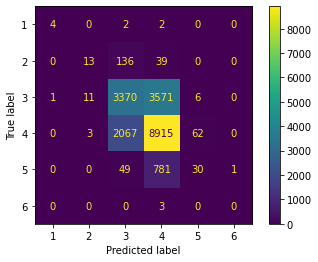

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(clf2, X_test, y_test)  
plt.show()

In [ ]:
from sklearn.metrics import precision_score
precision_score(y_test, y_pred2, average='macro')

0.47609473251430584

In [ ]:
from sklearn.metrics import precision_score
precision_score(y_test, y_pred2, average='micro')

0.6468058323717613

In [ ]:
from sklearn.metrics import recall_score
recall_score(y_test, y_pred2, average='micro')

0.6468058323717613

In [ ]:
from sklearn.metrics import cohen_kappa_score
cohen_kappa_score(y_test, y_pred2)

0.2756076820323782

In [ ]:
from sklearn.metrics import f1_score
f1_score(y_test, y_pred2, average='micro')

0.6468058323717613

In [ ]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf2, X, y, cv=3)

In [ ]:
scores

array([0.63392183, 0.61626699, 0.62769071])

In [ ]:
for i in X_values:
  print(" "+i+",",end="")

 Dem_age, Dem_gender, Dem_edu, Dem_edu_mom, Dem_employment, Country, Dem_Expat, Dem_maritalstatus, Dem_dependents, Dem_riskgroup, Dem_isolation, Scale_SLON_1, Scale_SLON_2, Scale_SLON_3, OECD_people_1, OECD_people_2, OECD_insititutions_1, OECD_insititutions_2, OECD_insititutions_3, OECD_insititutions_4, OECD_insititutions_5, OECD_insititutions_6, Corona_concerns_1, Corona_concerns_2, Corona_concerns_3, Corona_concerns_4, Corona_concerns_5, Trust_countrymeasure, Compliance_1, Compliance_2, Compliance_3, Compliance_4, Compliance_5, Compliance_6, Expl_media_1, Expl_media_2, Expl_media_3, Expl_media_4, Expl_media_5, Expl_media_6, Avg_10-19, stringency_index, Avg_Coping,

Feature importance

In [ ]:
from sklearn.inspection import permutation_importance
result = permutation_importance(clf2, X, y, n_repeats=10, random_state=0)

In [ ]:
l = list(result.importances_mean)
a = l.copy()
a.sort(reverse = True)
for i in range(5):
  print(l[l.index(a[i])], X_values[l.index(a[i])])

0.06856117824773418 Scale_SLON_2
0.036955563947633455 Avg_10-19
0.01565017623363546 Scale_SLON_3
0.013286757301107798 Corona_concerns_2
0.0117997860020141 stringency_index


To visualise decision tree

In [ ]:
pip install six

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.54529 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.54529 to fit



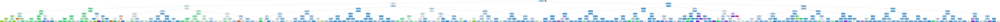

In [ ]:
from six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = X_values,class_names=['1','2','3','4','5','6'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Covid_Dis.png')
Image(graph.create_png())

Decision tree in text format 

In [ ]:

from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

r = export_text(clf2, feature_names=X_values)

In [ ]:
print(r)

|--- Scale_SLON_2 <= 2.50
|   |--- Scale_SLON_3 <= 2.50
|   |   |--- stringency_index <= 35.67
|   |   |   |--- Scale_SLON_2 <= 1.50
|   |   |   |   |--- Scale_SLON_1 <= 1.50
|   |   |   |   |   |--- Corona_concerns_5 <= 3.50
|   |   |   |   |   |   |--- OECD_people_2 <= 6.50
|   |   |   |   |   |   |   |--- Compliance_6 <= 2.50
|   |   |   |   |   |   |   |   |--- class: 2
|   |   |   |   |   |   |   |--- Compliance_6 >  2.50
|   |   |   |   |   |   |   |   |--- class: 2
|   |   |   |   |   |   |--- OECD_people_2 >  6.50
|   |   |   |   |   |   |   |--- Corona_concerns_2 <= 4.50
|   |   |   |   |   |   |   |   |--- class: 3
|   |   |   |   |   |   |   |--- Corona_concerns_2 >  4.50
|   |   |   |   |   |   |   |   |--- class: 2
|   |   |   |   |   |--- Corona_concerns_5 >  3.50
|   |   |   |   |   |   |--- Scale_SLON_3 <= 0.50
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- Scale_SLON_3 >  0.50
|   |   |   |   |   |   |   |--- OECD_people_1 <= 6.50
|   |   |   | 




# ADABOOST

# Preprocessing Data

In [ ]:
clean_cd_df = pd.read_csv("/content/drive/MyDrive/DA_Project_files/All_datasets/Covidistress_final.csv")
health_expend_df = pd.read_csv("/content/drive/MyDrive/DA_Project_files/All_datasets/Healthcare_expenditure.csv")
string_ind_df = pd.read_csv("/content/drive/MyDrive/DA_Project_files/All_datasets/covid-stringency-index.csv")


In [ ]:
clean_cd_df['avg_stress'] = (clean_cd_df['Scale_PSS10_UCLA_1']+ clean_cd_df['Scale_PSS10_UCLA_1']+clean_cd_df['Scale_PSS10_UCLA_2']+clean_cd_df['Scale_PSS10_UCLA_3']+clean_cd_df['Scale_PSS10_UCLA_4']+clean_cd_df['Scale_PSS10_UCLA_5']+clean_cd_df['Scale_PSS10_UCLA_6']+clean_cd_df['Scale_PSS10_UCLA_7']+clean_cd_df['Scale_PSS10_UCLA_8']+clean_cd_df['Scale_PSS10_UCLA_9']+clean_cd_df['Scale_PSS10_UCLA_10'])/10

In [ ]:
clean_cd_df = clean_cd_df.loc[clean_cd_df['avg_stress'] != 0]

In [ ]:
health_expend_df = health_expend_df.drop(health_expend_df.index[0])

In [ ]:
health_expend_df = health_expend_df.drop(labels = ['Unnamed: 1','Unnamed: 2', 'Unnamed: 3'] , axis = 1)

In [ ]:
health_expend_df.fillna(0)

,Year,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
1,Australia,68.6,69.2,67.5,65.0,64.7,65.8,66.0,66.3,66.6,68.7,..
2,Austria,74.6,74.6,74.7,74.0,74.0,74.1,74.0,74.0,74.8,75.2,76.4
3,Belgium,76.1,76.1,76.6,76.1,76.4,75.9,77.3,77.4,76.9,76.8,..
4,Canada,69.9,70.2,70.4,70.7,70.6,70.6,69.7,69.8,70.2,70.2,..
5,Chile,59.0,59.5,60.0,59.4,58.9,58.7,58.5,60.1,60.3,60.6,62.8
6,Colombia,74.8,76.0,73.9,75.6,76.2,76.3,76.1,76.6,77.3,77.5,..
7,Costa Rica,73.1,73.0,74.1,74.9,73.0,74.8,75.1,75.0,73.8,73.9,..
8,Czech Republic,83.3,83.9,83.7,83.6,82.7,82.4,82.0,82.1,83.0,81.8,..
9,Denmark,83.9,83.6,84.0,84.3,84.2,84.2,84.1,84.0,83.9,83.3,..
10,Estonia,76.3,76.7,76.7,75.6,75.7,75.6,75.7,73.6,73.7,74.5,78.2


In [ ]:
health_expend_df = health_expend_df.replace('..', int(0))

In [ ]:
health_expend_df  = health_expend_df.astype({'2019':'float64'})

In [ ]:
health_expend_new_df = pd.DataFrame()
health_expend_new_df['Country'] = health_expend_df['Year']

health_expend_new_df['Avg_10-19'] = health_expend_df.mean(axis = 1)

In [ ]:
combined_new_df = pd.DataFrame()
combined_new_df = pd.merge(left = clean_cd_df, right = health_expend_new_df, how = 'left', left_on = 'Country', right_on = 'Country')

In [ ]:
string_ind_df["Day"]=pd.to_datetime(string_ind_df["Day"])

In [ ]:
string_ind_df=string_ind_df[(pd.DatetimeIndex(string_ind_df["Day"]).year==2020)&(pd.DatetimeIndex(string_ind_df["Day"]).month<6)]

In [ ]:
string_ind_df = string_ind_df.groupby("Entity")["stringency_index"].mean()

In [ ]:
combined_new_df = pd.merge(left = combined_new_df, right = string_ind_df, how = 'left', left_on= 'Country', right_on = 'Entity')

In [ ]:
combined_new_df = combined_new_df.drop('Dem_state', axis = 1)

In [ ]:
combined_new_df = combined_new_df.drop(labels = ['Scale_PSS10_UCLA_1', 'Scale_PSS10_UCLA_2', 'Scale_PSS10_UCLA_3',
       'Scale_PSS10_UCLA_4', 'Scale_PSS10_UCLA_5', 'Scale_PSS10_UCLA_6',
       'Scale_PSS10_UCLA_7', 'Scale_PSS10_UCLA_8', 'Scale_PSS10_UCLA_9',
       'Scale_PSS10_UCLA_10',], axis = 1)

In [ ]:
new_list = ['Expl_Coping_1', 'Expl_Coping_2', 'Expl_Coping_3', 'Expl_Coping_4',
       'Expl_Coping_5', 'Expl_Coping_6', 'Expl_Coping_7', 'Expl_Coping_8',
       'Expl_Coping_9', 'Expl_Coping_10', 'Expl_Coping_11', 'Expl_Coping_12',
       'Expl_Coping_13', 'Expl_Coping_14', 'Expl_Coping_15', 'Expl_Coping_16']

combined_new_df['Avg_Coping'] = combined_new_df['Expl_Coping_1']
for i in new_list:
  combined_new_df['Avg_Coping'] += combined_new_df[i]/16

In [ ]:
combined_new_df = combined_new_df.drop(labels = ['Expl_Coping_1', 'Expl_Coping_2', 'Expl_Coping_3', 'Expl_Coping_4',
       'Expl_Coping_5', 'Expl_Coping_6', 'Expl_Coping_7', 'Expl_Coping_8',
       'Expl_Coping_9', 'Expl_Coping_10', 'Expl_Coping_11', 'Expl_Coping_12',
       'Expl_Coping_13', 'Expl_Coping_14', 'Expl_Coping_15', 'Expl_Coping_16'], axis = 1)

# Label Encoding Categorical variable

In [ ]:
combined_new_df_cat =combined_new_df.select_dtypes(['object']).apply(pd.Series.astype,dtype='category')

In [ ]:
cols=combined_new_df_cat.select_dtypes(['category']).columns.to_list()

In [ ]:
combined_new_df_nona = combined_new_df_cat.dropna(how = "any")

In [ ]:
for k in combined_new_df_nona.columns:
 print(k, combined_new_df_nona[k].isnull().values.any())

Dem_gender False
Dem_edu False
Dem_edu_mom False
Dem_employment False
Country False
Dem_Expat False
Dem_maritalstatus False
Dem_riskgroup False
Dem_isolation False


In [ ]:
from sklearn.preprocessing import LabelEncoder
label_object = {}
for col in cols:
    labelencoder = LabelEncoder()
    labelencoder.fit(combined_new_df_nona[col])
    combined_new_df_nona[col] = labelencoder.fit_transform(combined_new_df_nona[col])
    label_object[col] = labelencoder



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
for i in combined_new_df_nona.columns:
  combined_new_df[i] = combined_new_df_nona[i]

In [ ]:
combined_final = combined_new_df.drop(labels = ['Unnamed: 0', 'Dem_isolation_adults', 'Dem_isolation_kids', 'AD_gain', 'AD_loss'] , axis = 1)

In [ ]:
combined_final_small = combined_final.dropna(how = "any")

In [ ]:
X_values = combined_final_small.columns.to_list()

In [ ]:
(X_values).remove('avg_stress')

In [ ]:
(X_values).remove('PSS10_avg')

# AdaBoost 

In [ ]:
bins = [0, 1, 2, 3, 4, 5, 6]
labels = [1,2,3,4,5,6]

In [ ]:
combined_final_small['avg_stress'] = pd.cut(combined_final_small['avg_stress'], bins = bins, labels =labels)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
X = combined_final_small[X_values]
y = combined_final_small['avg_stress']

In [ ]:
X

,Dem_age,Dem_gender,Dem_edu,Dem_edu_mom,Dem_employment,Country,Dem_Expat,Dem_maritalstatus,Dem_dependents,Dem_riskgroup,Dem_isolation,Scale_SLON_1,Scale_SLON_2,Scale_SLON_3,OECD_people_1,OECD_people_2,OECD_insititutions_1,OECD_insititutions_2,OECD_insititutions_3,OECD_insititutions_4,OECD_insititutions_5,OECD_insititutions_6,Corona_concerns_1,Corona_concerns_2,Corona_concerns_3,Corona_concerns_4,Corona_concerns_5,Trust_countrymeasure,Compliance_1,Compliance_2,Compliance_3,Compliance_4,Compliance_5,Compliance_6,Expl_media_1,Expl_media_2,Expl_media_3,Expl_media_4,Expl_media_5,Expl_media_6,Avg_10-19,stringency_index,Avg_Coping
4,68,1.0,0.0,0.0,3.0,69.0,0.0,1.0,0.0,0.0,4.0,2,2,3,7,7,7,7,8,8,7,8,5,5,5,5,5,5,5,5,5,4,4,1,5.0,5.0,5.0,5.0,5.0,5.0,75.28,64.064394,9.1875
18,69,0.0,2.0,6.0,3.0,96.0,0.0,0.0,0.0,2.0,1.0,1,3,1,8,10,8,0,5,3,2,4,5,5,5,3,5,2,6,6,5,1,6,6,6.0,2.0,4.0,4.0,5.0,4.0,51.50,42.804621,9.9375
19,28,0.0,2.0,7.0,0.0,49.0,1.0,1.0,0.0,0.0,4.0,2,2,3,5,9,1,1,7,7,7,4,2,5,3,6,6,0,6,6,5,2,2,2,4.0,4.0,4.0,5.0,2.0,2.0,79.11,56.309167,7.5625
20,67,0.0,3.0,7.0,3.0,96.0,0.0,0.0,1.0,0.0,2.0,1,1,1,7,9,2,2,3,3,8,3,0,0,0,2,0,0,0,0,0,0,0,0,5.0,6.0,3.0,6.0,4.0,5.0,51.50,42.804621,8.0625
28,33,0.0,0.0,0.0,0.0,158.0,1.0,3.0,0.0,0.0,4.0,2,4,4,6,8,3,2,3,2,2,3,4,4,4,3,5,2,5,6,5,4,3,4,4.0,6.0,5.0,2.0,4.0,1.0,69.16,45.521061,4.7500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116087,58,1.0,0.0,7.0,4.0,38.0,1.0,1.0,3.0,2.0,4.0,1,1,1,9,10,6,7,7,8,7,8,2,2,3,5,5,6,6,6,6,1,5,1,6.0,3.0,4.0,1.0,5.0,2.0,83.95,44.100833,8.2500
116088,28,1.0,0.0,5.0,0.0,38.0,1.0,3.0,0.0,1.0,1.0,1,1,5,3,6,9,9,9,9,9,7,1,3,2,5,5,6,6,3,2,2,4,1,5.0,3.0,6.0,3.0,6.0,1.0,83.95,44.100833,8.0000
116091,33,1.0,3.0,5.0,0.0,38.0,1.0,3.0,0.0,1.0,4.0,3,2,2,6,8,6,7,8,8,9,8,4,5,4,5,6,4,5,5,4,2,3,4,5.0,5.0,5.0,3.0,3.0,4.0,83.95,44.100833,7.8125
116095,54,1.0,3.0,3.0,0.0,38.0,1.0,1.0,0.0,1.0,4.0,2,2,1,7,9,7,8,8,6,6,7,3,2,2,4,5,8,6,5,5,1,5,4,2.0,2.0,2.0,2.0,2.0,5.0,83.95,44.100833,9.1250


In [ ]:
from sklearn.ensemble import AdaBoostClassifier


In [ ]:
clf2 = AdaBoostClassifier(n_estimators=100)

In [ ]:
clf2.fit(X,y)

AdaBoostClassifier(n_estimators=100)

Adaboost (estimators = 100) accuracy = 0.607140609264854

The accuracy is not changing if the number of estimators are changed. 

In [ ]:
y

4         3
18        3
19        4
20        4
28        4
         ..
116087    3
116088    3
116091    4
116095    4
116096    5
Name: avg_stress, Length: 63552, dtype: category
Categories (6, int64): [1 < 2 < 3 < 4 < 5 < 6]

In [ ]:
clf2.score(X,y)

0.607140609264854

In [ ]:
clf2.feature_importances_

array([0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.5,
       0.5, 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ,
       0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ,
       0. , 0. , 0. , 0. ])

In [ ]:
clf2.n_classes_

6

In [ ]:
clf2.base_estimator_

DecisionTreeClassifier(max_depth=1)

In [ ]:
clf2.estimators_

[DecisionTreeClassifier(max_depth=1, random_state=1527225429),
 DecisionTreeClassifier(max_depth=1, random_state=1566425714),
 DecisionTreeClassifier(max_depth=1, random_state=2131284226),
 DecisionTreeClassifier(max_depth=1, random_state=36800022),
 DecisionTreeClassifier(max_depth=1, random_state=774282736),
 DecisionTreeClassifier(max_depth=1, random_state=362375058),
 DecisionTreeClassifier(max_depth=1, random_state=1320268738),
 DecisionTreeClassifier(max_depth=1, random_state=1042269041),
 DecisionTreeClassifier(max_depth=1, random_state=687288615),
 DecisionTreeClassifier(max_depth=1, random_state=377777004),
 DecisionTreeClassifier(max_depth=1, random_state=1394526991),
 DecisionTreeClassifier(max_depth=1, random_state=2021755093),
 DecisionTreeClassifier(max_depth=1, random_state=1741081501),
 DecisionTreeClassifier(max_depth=1, random_state=1345700984),
 DecisionTreeClassifier(max_depth=1, random_state=1361993276),
 DecisionTreeClassifier(max_depth=1, random_state=757692661),

In [ ]:
clf2.estimator_weights_

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
clf2.estimator_errors_

array([0.39259189, 0.666906  , 0.66670989, 0.66674911, 0.66667367,
       0.66668106, 0.66666943, 0.66667212, 0.66666842, 0.66666984,
       0.6666681 , 0.66666901, 0.66666799, 0.66666865, 0.66666797,
       0.66666847, 0.66666799, 0.66666839, 0.66666803, 0.66666835,
       0.66666807, 0.66666833, 0.66666811, 0.66666832, 0.66666814,
       0.66666832, 0.66666818, 0.66666832, 0.66666821, 0.66666832,
       0.66666823, 0.66666832, 0.66666825, 0.66666833, 0.66666827,
       0.66666833, 0.66666828, 0.66666833, 0.66666829, 0.66666834,
       0.6666683 , 0.66666834, 0.66666831, 0.66666834, 0.66666832,
       0.66666834, 0.66666832, 0.66666834, 0.66666833, 0.66666834,
       0.66666833, 0.66666834, 0.66666834, 0.66666835, 0.66666834,
       0.66666835, 0.66666834, 0.66666835, 0.66666834, 0.66666835,
       0.66666834, 0.66666835, 0.66666834, 0.66666835, 0.66666834,
       0.66666835, 0.66666835, 0.66666835, 0.66666835, 0.66666835,
       0.66666835, 0.66666835, 0.66666835, 0.66666835, 0.66666

In [ ]:
bins = [0, 1, 2, 3, 4, 5, 6]
labels = [1,2,3,4,5,6]

In [ ]:
combined_final_small['avg_stress'] = pd.cut(combined_final_small['avg_stress'], bins = bins, labels =labels)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
X = combined_final_small[X_values]
y = combined_final_small['avg_stress']

In [ ]:
X

,Dem_age,Dem_gender,Dem_edu,Dem_edu_mom,Dem_employment,Country,Dem_Expat,Dem_maritalstatus,Dem_dependents,Dem_riskgroup,Dem_isolation,Scale_SLON_1,Scale_SLON_2,Scale_SLON_3,OECD_people_1,OECD_people_2,OECD_insititutions_1,OECD_insititutions_2,OECD_insititutions_3,OECD_insititutions_4,OECD_insititutions_5,OECD_insititutions_6,Corona_concerns_1,Corona_concerns_2,Corona_concerns_3,Corona_concerns_4,Corona_concerns_5,Trust_countrymeasure,Compliance_1,Compliance_2,Compliance_3,Compliance_4,Compliance_5,Compliance_6,Expl_media_1,Expl_media_2,Expl_media_3,Expl_media_4,Expl_media_5,Expl_media_6,Avg_10-19,stringency_index,Avg_Coping
4,68,1.0,0.0,0.0,3.0,69.0,0.0,1.0,0.0,0.0,4.0,2,2,3,7,7,7,7,8,8,7,8,5,5,5,5,5,5,5,5,5,4,4,1,5.0,5.0,5.0,5.0,5.0,5.0,75.28,64.064394,9.1875
18,69,0.0,2.0,6.0,3.0,96.0,0.0,0.0,0.0,2.0,1.0,1,3,1,8,10,8,0,5,3,2,4,5,5,5,3,5,2,6,6,5,1,6,6,6.0,2.0,4.0,4.0,5.0,4.0,51.50,42.804621,9.9375
19,28,0.0,2.0,7.0,0.0,49.0,1.0,1.0,0.0,0.0,4.0,2,2,3,5,9,1,1,7,7,7,4,2,5,3,6,6,0,6,6,5,2,2,2,4.0,4.0,4.0,5.0,2.0,2.0,79.11,56.309167,7.5625
20,67,0.0,3.0,7.0,3.0,96.0,0.0,0.0,1.0,0.0,2.0,1,1,1,7,9,2,2,3,3,8,3,0,0,0,2,0,0,0,0,0,0,0,0,5.0,6.0,3.0,6.0,4.0,5.0,51.50,42.804621,8.0625
28,33,0.0,0.0,0.0,0.0,158.0,1.0,3.0,0.0,0.0,4.0,2,4,4,6,8,3,2,3,2,2,3,4,4,4,3,5,2,5,6,5,4,3,4,4.0,6.0,5.0,2.0,4.0,1.0,69.16,45.521061,4.7500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116087,58,1.0,0.0,7.0,4.0,38.0,1.0,1.0,3.0,2.0,4.0,1,1,1,9,10,6,7,7,8,7,8,2,2,3,5,5,6,6,6,6,1,5,1,6.0,3.0,4.0,1.0,5.0,2.0,83.95,44.100833,8.2500
116088,28,1.0,0.0,5.0,0.0,38.0,1.0,3.0,0.0,1.0,1.0,1,1,5,3,6,9,9,9,9,9,7,1,3,2,5,5,6,6,3,2,2,4,1,5.0,3.0,6.0,3.0,6.0,1.0,83.95,44.100833,8.0000
116091,33,1.0,3.0,5.0,0.0,38.0,1.0,3.0,0.0,1.0,4.0,3,2,2,6,8,6,7,8,8,9,8,4,5,4,5,6,4,5,5,4,2,3,4,5.0,5.0,5.0,3.0,3.0,4.0,83.95,44.100833,7.8125
116095,54,1.0,3.0,3.0,0.0,38.0,1.0,1.0,0.0,1.0,4.0,2,2,1,7,9,7,8,8,6,6,7,3,2,2,4,5,8,6,5,5,1,5,4,2.0,2.0,2.0,2.0,2.0,5.0,83.95,44.100833,9.1250


In [ ]:
from sklearn.ensemble import AdaBoostClassifier


In [ ]:
clf2 = AdaBoostClassifier(n_estimators=100)

In [ ]:
clf2.fit(X,y)

AdaBoostClassifier(n_estimators=100)

Adaboost (estimators = 100) accuracy = 0.607140609264854

The accuracy is not changing if the number of estimators are changed. 

In [ ]:
y

4         3
18        3
19        4
20        4
28        4
         ..
116087    3
116088    3
116091    4
116095    4
116096    5
Name: avg_stress, Length: 63552, dtype: category
Categories (6, int64): [1 < 2 < 3 < 4 < 5 < 6]

In [ ]:
clf2.score(X,y)

0.607140609264854

In [ ]:
clf2.feature_importances_

array([0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.5,
       0.5, 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ,
       0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ,
       0. , 0. , 0. , 0. ])

In [ ]:
clf2.n_classes_

6

In [ ]:
clf2.base_estimator_

DecisionTreeClassifier(max_depth=1)

In [ ]:
clf2.estimators_

[DecisionTreeClassifier(max_depth=1, random_state=1527225429),
 DecisionTreeClassifier(max_depth=1, random_state=1566425714),
 DecisionTreeClassifier(max_depth=1, random_state=2131284226),
 DecisionTreeClassifier(max_depth=1, random_state=36800022),
 DecisionTreeClassifier(max_depth=1, random_state=774282736),
 DecisionTreeClassifier(max_depth=1, random_state=362375058),
 DecisionTreeClassifier(max_depth=1, random_state=1320268738),
 DecisionTreeClassifier(max_depth=1, random_state=1042269041),
 DecisionTreeClassifier(max_depth=1, random_state=687288615),
 DecisionTreeClassifier(max_depth=1, random_state=377777004),
 DecisionTreeClassifier(max_depth=1, random_state=1394526991),
 DecisionTreeClassifier(max_depth=1, random_state=2021755093),
 DecisionTreeClassifier(max_depth=1, random_state=1741081501),
 DecisionTreeClassifier(max_depth=1, random_state=1345700984),
 DecisionTreeClassifier(max_depth=1, random_state=1361993276),
 DecisionTreeClassifier(max_depth=1, random_state=757692661),

In [ ]:
clf2.estimator_weights_

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
clf2.estimator_errors_

array([0.39259189, 0.666906  , 0.66670989, 0.66674911, 0.66667367,
       0.66668106, 0.66666943, 0.66667212, 0.66666842, 0.66666984,
       0.6666681 , 0.66666901, 0.66666799, 0.66666865, 0.66666797,
       0.66666847, 0.66666799, 0.66666839, 0.66666803, 0.66666835,
       0.66666807, 0.66666833, 0.66666811, 0.66666832, 0.66666814,
       0.66666832, 0.66666818, 0.66666832, 0.66666821, 0.66666832,
       0.66666823, 0.66666832, 0.66666825, 0.66666833, 0.66666827,
       0.66666833, 0.66666828, 0.66666833, 0.66666829, 0.66666834,
       0.6666683 , 0.66666834, 0.66666831, 0.66666834, 0.66666832,
       0.66666834, 0.66666832, 0.66666834, 0.66666833, 0.66666834,
       0.66666833, 0.66666834, 0.66666834, 0.66666835, 0.66666834,
       0.66666835, 0.66666834, 0.66666835, 0.66666834, 0.66666835,
       0.66666834, 0.66666835, 0.66666834, 0.66666835, 0.66666834,
       0.66666835, 0.66666835, 0.66666835, 0.66666835, 0.66666835,
       0.66666835, 0.66666835, 0.66666835, 0.66666835, 0.66666

# AdaBoost using repeated stratified k-fold cross-validation, with three repeats and 10 folds. 

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
# evaluate adaboost algorithm for classification
from numpy import mean
from numpy import std

In [ ]:
clf3 = AdaBoostClassifier(n_estimators=100)

In [ ]:
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

In [ ]:
n_scores = cross_val_score(clf3, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')


In [ ]:
n_scores

array([0.60462555, 0.61359346, 0.59653816, 0.60991345, 0.61195909,
       0.60047207, 0.60991345, 0.60692368, 0.60550747, 0.61195909,
       0.60478288, 0.60997483, 0.60708104, 0.60629426, 0.60959874,
       0.60346184, 0.60487805, 0.60818253, 0.60660897, 0.61054288,
       0.6003776 , 0.60179358, 0.60519276, 0.60409127, 0.60173092,
       0.61148702, 0.61636507, 0.6086546 , 0.6122738 , 0.60944138])

Mean accuracy = 0.607, std dev = 0.004

In [ ]:
print('Accuracy: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

Accuracy: 0.607 (0.004)


XGBOOST

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error
import pandas as pd
import numpy as np

In [ ]:
y = y.replace({1: 0, 2: 1,3: 2, 4: 3,5: 4, 6: 5})

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

In [ ]:
xg_reg = xgb.XGBRegressor(objective ='multi:softmax', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 100, num_class = 6)

In [ ]:

xg_reg.fit(X_train,y_train)

preds = xg_reg.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, preds)

0.6713869876484935

In [ ]:
from sklearn.metrics import cohen_kappa_score
cohen_kappa_score(y_test, preds)

0.3233801493182632

In [ ]:
from sklearn.metrics import precision_score
precision_score(y_test, preds, average= 'micro')

0.6721737078121313

# Permutation_importance to obtain important features

In [ ]:
clf4 = AdaBoostClassifier(n_estimators=100)

In [ ]:
clf4.fit(X,y)

AdaBoostClassifier(n_estimators=100)

In [ ]:
from sklearn.inspection import permutation_importance

result = permutation_importance(clf4, X, y,random_state=0)

This implies that Scale_SLON_2 and Scale_SLON_3 are significant in classifying avg_stress. This re-iterates what we've seen with Decision trees. Every other feature seems to have a very low significance. 

In [ ]:
result.importances_mean

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.10358761, 0.00015735, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        ])

In [ ]:
result.importances_std

array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       2.24364423e-03, 9.64860883e-05, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00])